# Data Preparation

In [1]:
import pandas as pd
import numpy as np
import os
from sklearn.model_selection import GroupShuffleSplit
from google.colab import drive
import zipfile

In [2]:
# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Definisi Path
FOLDER_DATASET = '/content/drive/MyDrive/Dataset /'
ZIP_PATH = os.path.join(FOLDER_DATASET, 'hillel-yaffe-glaucoma-dataset-hygd-a-gold-standard-annotated-fundus-dataset-for-glaucoma-detection-1.0.0.zip')
EXTRACT_PATH = '/content/dataset/'

# 3. Buat direktori dan ekstrak file ZIP langsung (menggunakan Python zipfile)
os.makedirs(EXTRACT_PATH, exist_ok=True)
with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
    zip_ref.extractall(EXTRACT_PATH)
print("Ekstraksi selesai.")

# 4. Path CSV dan Image setelah diekstrak
CSV_PATH = os.path.join(EXTRACT_PATH, 'hillel-yaffe-glaucoma-dataset-hygd-a-gold-standard-annotated-fundus-dataset-for-glaucoma-detection-1.0.0/Labels.csv')
IMAGE_DIR = os.path.join(EXTRACT_PATH, 'hillel-yaffe-glaucoma-dataset-hygd-a-gold-standard-annotated-fundus-dataset-for-glaucoma-detection-1.0.0/Images')

# 5. Baca dan proses CSV
df = pd.read_csv(CSV_PATH)
df['Label'] = df['Label'].map({'GON+': 1, 'GON-': 0})

# 6. GroupShuffleSplit untuk Train (70%) dan Sisa (30%)
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)
train_idx, temp_idx = next(gss.split(df, groups=df['Patient']))

train_df = df.iloc[train_idx].reset_index(drop=True)
temp_df = df.iloc[temp_idx].reset_index(drop=True)

# 7. GroupShuffleSplit untuk Val (15%) dan Test (15%) dari Sisa (30%)
gss_temp = GroupShuffleSplit(n_splits=1, train_size=0.5, random_state=42)
val_idx, test_idx = next(gss_temp.split(temp_df, groups=temp_df['Patient']))

val_df = temp_df.iloc[val_idx].reset_index(drop=True)
test_df = temp_df.iloc[test_idx].reset_index(drop=True)

# 8. Cetak Hasil
print(f"Jumlah Train: {len(train_df)} (Pasien: {train_df['Patient'].nunique()})")
print(f"Jumlah Val  : {len(val_df)} (Pasien: {val_df['Patient'].nunique()})")
print(f"Jumlah Test : {len(test_df)} (Pasien: {test_df['Patient'].nunique()})")

Mounted at /content/drive
Ekstraksi selesai.
Jumlah Train: 537 (Pasien: 201)
Jumlah Val  : 106 (Pasien: 43)
Jumlah Test : 104 (Pasien: 44)


## Custom Dataset (PyTorch)

In [3]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

class GlaucomaDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        # Ambil nama file dan path
        img_name = self.dataframe.loc[idx, 'Image Name']
        img_path = os.path.join(self.image_dir, img_name)

        # Buka gambar (pastikan formatnya RGB)
        image = Image.open(img_path).convert('RGB')

        # Ambil label dan skor kualitas
        label = int(self.dataframe.loc[idx, 'Label'])
        quality_score = float(self.dataframe.loc[idx, 'Quality Score'])

        if self.transform:
            image = self.transform(image)

        # Kembalikan sebagai tensor
        return image, torch.tensor(label, dtype=torch.float32), torch.tensor(quality_score, dtype=torch.float32)

## Augmentasi dan DataLoader

In [71]:
# 3. Transformasi dan Augmentasi
# Gunakan ukuran standar CNN
# train_transform = transforms.Compose([
#     transforms.Resize((256, 256)),
#     transforms.RandomHorizontalFlip(),
#     transforms.RandomRotation(15),
#     transforms.ToTensor()
# ])

# eval_transform = transforms.Compose([
#     transforms.Resize((256, 256)),
#     transforms.ToTensor()
# ])

train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Tambahkan ini
])

eval_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Tambahkan ini
])

# 4. Inisialisasi Dataset
train_dataset = GlaucomaDataset(train_df, IMAGE_DIR, transform=train_transform)
val_dataset = GlaucomaDataset(val_df, IMAGE_DIR, transform=eval_transform)
test_dataset = GlaucomaDataset(test_df, IMAGE_DIR, transform=eval_transform)

# 5. Membuat DataLoader
BATCH_SIZE = 32

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# Uji coba mengambil satu batch data
images, labels, qualities = next(iter(train_loader))
print(f"Shape Tensor Gambar : {images.shape}")
print(f"Shape Tensor Label  : {labels.shape}")
print(f"Shape Tensor Kualitas: {qualities.shape}")

Shape Tensor Gambar : torch.Size([32, 3, 256, 256])
Shape Tensor Label  : torch.Size([32])
Shape Tensor Kualitas: torch.Size([32])


# EDA

In [5]:
print("Verifikasi Statistik Dataset")
print(f"Total Citra: {len(df)} (Ekspektasi: 747)")
print(f"Total Pasien Unik: {df['Patient'].nunique()} (Ekspektasi: 288)")
print(f"Jumlah GON+: {len(df[df['Label'] == 1])} (Ekspektasi: 548)")
print(f"Jumlah GON-: {len(df[df['Label'] == 0])} (Ekspektasi: 199)")
print(f"Rata-rata Skor Kualitas: {df['Quality Score'].mean():.2f} (Ekspektasi: 5.9)")

Verifikasi Statistik Dataset
Total Citra: 747 (Ekspektasi: 747)
Total Pasien Unik: 288 (Ekspektasi: 288)
Jumlah GON+: 548 (Ekspektasi: 548)
Jumlah GON-: 199 (Ekspektasi: 199)
Rata-rata Skor Kualitas: 5.90 (Ekspektasi: 5.9)


In [6]:
# Menghitung jumlah gambar per pasien dan jumlah label unik per pasien
# Perbaikan: Lakukan groupby pada DataFrame 'df', bukan pada Series 'df["Label"]'
patient_analysis = df.groupby('Patient').agg(
    Total_Images=('Image Name', 'count'),
    Unique_Labels=('Label', 'nunique'),
    Labels_List=('Label', lambda x: list(x))
).reset_index()

# 1. Menampilkan Pasien dengan Label Campuran (GON+ dan GON-)
mixed_labels_patients = patient_analysis[patient_analysis['Unique_Labels'] > 1]
print(f"Total pasien dengan label campuran (GON+ & GON-): {len(mixed_labels_patients)} pasien\n")

if not mixed_labels_patients.empty:
    print("Contoh pasien dengan label campuran:")
    print(mixed_labels_patients.head().to_string(index=False))
print("-" * 50)

# 2. Menampilkan Statistik Distribusi Gambar per Pasien
print("\nStatistik jumlah gambar per pasien:")
print(patient_analysis['Total_Images'].value_counts().sort_index().to_string())
print("-" * 50)

# 3. Menampilkan Pasien dengan Label Seragam
uniform_labels_patients = patient_analysis[patient_analysis['Unique_Labels'] == 1]
print(f"\nTotal pasien dengan label seragam (hanya GON+ atau hanya GON-): {len(uniform_labels_patients)} pasien")

Total pasien dengan label campuran (GON+ & GON-): 0 pasien

--------------------------------------------------

Statistik jumlah gambar per pasien:
Total_Images
1      81
2     103
3      44
4      25
5      14
6       8
7       6
8       4
10      1
12      1
14      1
--------------------------------------------------

Total pasien dengan label seragam (hanya GON+ atau hanya GON-): 288 pasien


## 1. Distribusi Kelas & Jumlah Pasien Unik

Total pasien unik dalam dataset: 288
Pasien dengan indikasi GON+: 186
Pasien dengan indikasi GON-: 102


/tmp/ipykernel_4889/356008428.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x='Label', palette='Set1')


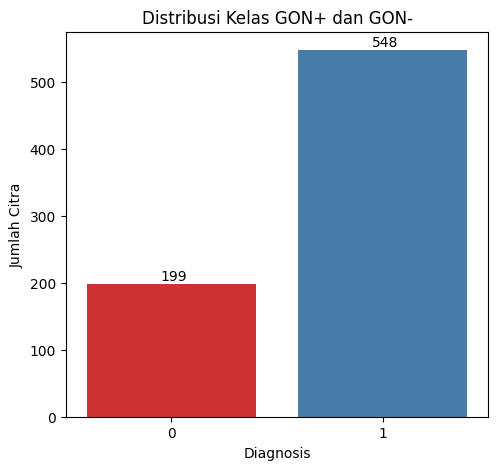

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
import random

plt.figure(figsize=(12, 5))

# Plot Distribusi Kelas
plt.subplot(1, 2, 1)
ax = sns.countplot(data=df, x='Label', palette='Set1')
plt.title('Distribusi Kelas GON+ dan GON-')
plt.xlabel('Diagnosis')
plt.ylabel('Jumlah Citra')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + 0.35, p.get_height() + 5))

# Informasi Pasien Unik
total_patients = df['Patient'].nunique()
print(f"Total pasien unik dalam dataset: {total_patients}")
gon_plus_patients = df[df['Label'] == 1]['Patient'].nunique()
gon_minus_patients = df[df['Label'] == 0]['Patient'].nunique()
print(f"Pasien dengan indikasi GON+: {gon_plus_patients}")
print(f"Pasien dengan indikasi GON-: {gon_minus_patients}")

## 2. Distribusi Skor Kualitas (*Quality Score*)

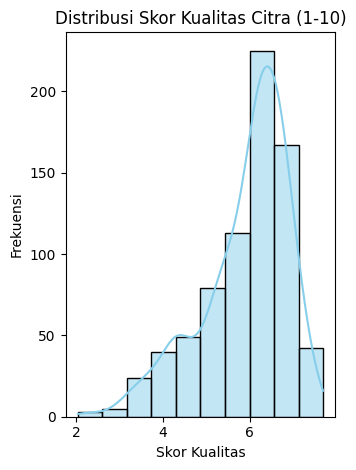

Rata-rata Skor Kualitas: 5.90
Standar Deviasi Skor Kualitas: 1.01
Nilai Minimum Skor Kualitas: 2.04
Nilai Maksimum Skor Kualitas: 7.69
Jumlah citra dengan skor > 5.9: 455


In [8]:
plt.subplot(1, 2, 2)
sns.histplot(data=df, x='Quality Score', bins=10, kde=True, color='skyblue')
plt.title('Distribusi Skor Kualitas Citra (1-10)')
plt.xlabel('Skor Kualitas')
plt.ylabel('Frekuensi')

plt.tight_layout()
plt.show()

print(f"Rata-rata Skor Kualitas: {df['Quality Score'].mean():.2f}")
print(f"Standar Deviasi Skor Kualitas: {df['Quality Score'].std():.2f}")
print(f"Nilai Minimum Skor Kualitas: {df['Quality Score'].min()}")
print(f"Nilai Maksimum Skor Kualitas: {df['Quality Score'].max()}")
jumlah_diatas_rata = (df['Quality Score'] > 5.9).sum()
print(f"Jumlah citra dengan skor > 5.9: {jumlah_diatas_rata}")

## 3. Visualisasi Sampel Berdasarkan Kualitas

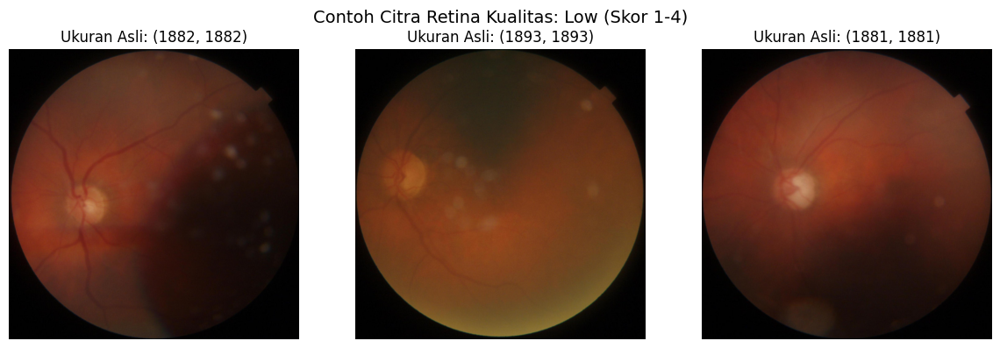

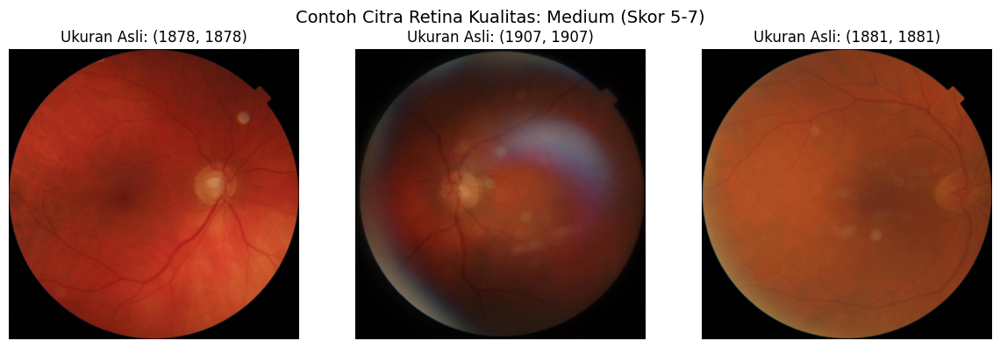

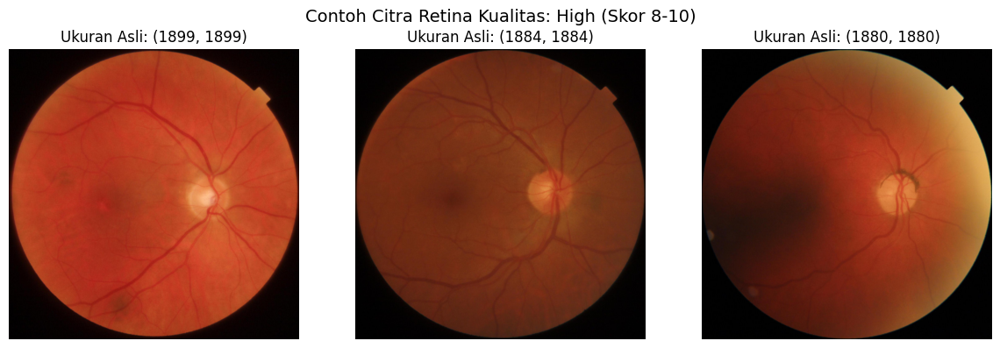

In [72]:
# Mengelompokkan kualitas menjadi Low (1-4), Medium (5-7), High (8-10)
low_quality = df[df['Quality Score'] <= 4]['Image Name'].tolist()
med_quality = df[(df['Quality Score'] > 4) & (df['Quality Score'] <= 7)]['Image Name'].tolist()
high_quality = df[df['Quality Score'] > 7]['Image Name'].tolist()

def show_samples(image_list, category_name):
    # Mengambil maksimal 3 gambar acak dari setiap kategori
    samples = random.sample(image_list, min(3, len(image_list)))

    fig, axes = plt.subplots(1, len(samples), figsize=(12, 4))
    fig.suptitle(f'Contoh Citra Retina Kualitas: {category_name}', fontsize=14)

    if len(samples) == 1:
        axes = [axes]

    for ax, img_name in zip(axes, samples):
        img_path = os.path.join(IMAGE_DIR, img_name)
        try:
            img = Image.open(img_path)
            ax.imshow(img)
            # Menampilkan ukuran asli citra untuk analisis isu prapemrosesan
            ax.set_title(f"Ukuran Asli: {img.size}")
            ax.axis('off')
        except FileNotFoundError:
            ax.set_title("File tidak ditemukan")
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Menampilkan gambar
if low_quality: show_samples(low_quality, "Low (Skor 1-4)")
if med_quality: show_samples(med_quality, "Medium (Skor 5-7)")
if high_quality: show_samples(high_quality, "High (Skor 8-10)")


## 4. Pengecekan Isu Prapemrosesan

In [10]:
# Mengecek apakah ada variasi ukuran gambar asli yang memerlukan standarisasi ketat
sample_to_check = df.sample(min(50, len(df)))['Image Name']
sizes = set()
for img_name in sample_to_check:
    try:
        with Image.open(os.path.join(IMAGE_DIR, img_name)) as img:
            sizes.add(img.size)
    except FileNotFoundError:
        pass

print("Analisis Isu Prapemrosesan ")
print(f"Variasi resolusi citra asli yang ditemukan dari 50 sampel acak: {sizes}")
if len(sizes) > 1:
    print("Kesimpulan: Terdapat variasi ukuran citra asli. Operasi 'Resize' (misal ke 512x512) sangat diwajibkan dalam pipeline DataLoader.")
else:
    print("Kesimpulan: Ukuran citra seragam.")

Analisis Isu Prapemrosesan 
Variasi resolusi citra asli yang ditemukan dari 50 sampel acak: {(1892, 1892), (1883, 1883), (1893, 1893), (1879, 1879), (1934, 1934), (1911, 1911), (1907, 1907), (1898, 1898), (1884, 1884), (1925, 1925), (1916, 1916), (1921, 1921), (1903, 1903), (1880, 1880), (1875, 1875), (1931, 1931), (1894, 1894), (1881, 1881), (1899, 1899), (1895, 1895), (1886, 1886), (1877, 1877), (1960, 1960), (1914, 1914), (1891, 1891), (1919, 1919), (1878, 1878), (1915, 1915), (1924, 1924), (1887, 1887)}
Kesimpulan: Terdapat variasi ukuran citra asli. Operasi 'Resize' (misal ke 512x512) sangat diwajibkan dalam pipeline DataLoader.


### Ringkasan Temuan & Rencana Penanganan

1. **Area Latar Belakang Hitam (*Black Borders*)**
Citra fundus menangkap retina dalam bentuk lingkaran dengan area hitam pekat yang luas di pinggirannya. Area hitam ini tidak memiliki informasi medis. Jika gambar langsung di-*resize*, area hitam ini akan ikut diproses, memakan ruang tensor, dan berpotensi membuat model fokus pada batas lingkaran alih-alih fitur penyakit.
* *Tindakan:* Perlu algoritma *cropping* untuk mendeteksi *bounding box* terluar dari retina dan membuang latar belakang hitam sebelum citra diubah ukurannya.

2. **Pencahayaan dan Kontras Tidak Merata**
Gambar retina memiliki pencahayaan yang tidak konsisten; ada area yang terlalu gelap atau memiliki pantulan cahaya kilat (*glare*). Hal ini menyulitkan model untuk melihat batas *optic cup* dan *optic disc* yang menjadi indikator glaukoma.
* *Tindakan:* Terapkan teknik peningkatan kontras seperti CLAHE (*Contrast Limited Adaptive Histogram Equalization*) pada tahap prapemrosesan untuk memperjelas detail pembuluh darah.

3. **Ketidakseimbangan Kelas (*Class Imbalance*)**
Dataset ini memiliki ketimpangan yang signifikan, yaitu 548 citra GON+ dan 199 citra GON-. Ini adalah isu yang secara eksplisit diwajibkan untuk ditangani dalam instruksi tugas. Tanpa penanganan, model akan bias dan cenderung selalu memprediksi GON+ untuk meminimalkan *loss*.

* *Tindakan:* Perlu disiapkan strategi pembobotan seperti *Weighted Random Sampler* pada DataLoader, atau menggunakan *Weighted Cross-Entropy* pada tahap pelatihan.



# Preprocessing

In [11]:
# Hanya import modul baru yang belum diimpor pada cell-cell sebelumnya
import cv2
from torch.utils.data import WeightedRandomSampler

# Penanganan Class Imbalance (Sampler)

# Menghitung bobot hanya dari data training yang sudah difilter
class_counts = train_df['Label'].value_counts().sort_index().values
class_weights = 1.0 / class_counts
sample_weights = [class_weights[label] for label in train_df['Label']]

imbalance_sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)


In [13]:
from torch.utils.data import DataLoader

# Membuat DataLoader khusus training yang menggunakan WeightedRandomSampler
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    sampler=imbalance_sampler, # <-- Sampler dipasang di sini
    num_workers=2
)


# CNN Modelling

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class BaselineCNN(nn.Module):
    def __init__(self):
        super(BaselineCNN, self).__init__()

        # Blok Konvolusi 1
        # Input: 3 x 256 x 256 -> Output: 16 x 128 x 128
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(16)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Blok Konvolusi 2
        # Input: 16 x 128 x 128 -> Output: 32 x 64 x 64
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(32)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Blok Konvolusi 3
        # Input: 32 x 64 x 64 -> Output: 64 x 32 x 32
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(64)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Blok Konvolusi 4
        # Input: 64 x 32 x 32 -> Output: 128 x 16 x 16
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(128)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Blok Konvolusi 5
        # Input: 128 x 16 x 16 -> Output: 256 x 8 x 8
        self.conv5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(256)
        self.pool5 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Global Average Pooling / Adaptive Pooling
        # Menyeragamkan output dari 8x8 menjadi 4x4 untuk mencegah ledakan parameter
        self.adaptive_pool = nn.AdaptiveAvgPool2d((4, 4))

        # Classification Head
        # Input dari flatten: 256 channels * 4 height * 4 width = 4096 node
        self.fc1 = nn.Linear(256 * 4 * 4, 512)
        self.dropout = nn.Dropout(p=0.5)
        self.spatial_dropout = nn.Dropout2d(p=0.2)

        # Output Layer: 1 node (karena klasifikasi biner)
        self.fc2 = nn.Linear(512, 1)

    def forward(self, x):
        # Ekstraksi Fitur
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.pool3(F.relu(self.bn3(self.conv3(x))))

        x = self.pool4(F.relu(self.bn4(self.conv4(x))))
        x = self.spatial_dropout(x)

        x = self.pool5(F.relu(self.bn5(self.conv5(x))))
        x = self.spatial_dropout(x)

        # Adaptive pooling & Flatten
        x = self.adaptive_pool(x)
        x = torch.flatten(x, 1)

        # Klasifikasi
        x = F.relu(self.fc1(x))
        x = self.dropout(x)

        # Sigmoid untuk menghasilkan probabilitas 0 hingga 1
        x = torch.sigmoid(self.fc2(x))

        # Meratakan output dari [batch_size, 1] menjadi [batch_size] agar sesuai dengan tensor label.
        # PENTING: gunakan squeeze(-1), bukan squeeze() tanpa argumen.
        # squeeze() akan membuang SEMUA dimensi berukuran 1, termasuk dimensi
        # batch saat batch_size == 1 (misalnya pada batch terakhir suatu epoch),
        # sehingga outputnya menjadi tensor 0-dim dan tidak cocok dengan shape
        # label [batch_size] -> inilah penyebab error
        # "Using a target size... that is different to the input size..." pada BCELoss.
        return x.squeeze(-1)


# Pengujian Dimensi Arsitektur (Sanity Check)

if __name__ == "__main__":
    # Inisialisasi model
    model = BaselineCNN()

    # Membuat tensor tiruan sesuai dengan DataLoader kita (Batch=16, Channel=3, H=512, W=512)
    dummy_input = torch.randn(32, 3, 256, 256)

    # Melakukan forward pass
    output = model(dummy_input)

    print(f"Shape Input  : {dummy_input.shape}")
    print(f"Shape Output : {output.shape}")

Shape Input  : torch.Size([32, 3, 256, 256])
Shape Output : torch.Size([32])


# Model Training and Validation

Menggunakan perangkat: cpu
Epoch 1/30
---------------
Train Loss: 0.6097 | Train Acc: 0.7058
Val Loss: 0.5865 | Val Acc: 0.7170
>> Model terbaik diperbarui

Epoch 2/30
---------------
Train Loss: 0.4831 | Train Acc: 0.7709
Val Loss: 0.5188 | Val Acc: 0.7075
>> Model terbaik diperbarui

Epoch 3/30
---------------
Train Loss: 0.3199 | Train Acc: 0.8771
Val Loss: 0.2744 | Val Acc: 0.8774
>> Model terbaik diperbarui

Epoch 4/30
---------------
Train Loss: 0.2988 | Train Acc: 0.8808
Val Loss: 0.2433 | Val Acc: 0.9245
>> Model terbaik diperbarui

Epoch 5/30
---------------
Train Loss: 0.2420 | Train Acc: 0.9069
Val Loss: 0.2162 | Val Acc: 0.8962
>> Model terbaik diperbarui

Epoch 6/30
---------------
Train Loss: 0.1897 | Train Acc: 0.9255
Val Loss: 0.2578 | Val Acc: 0.9340

Epoch 7/30
---------------
Train Loss: 0.2035 | Train Acc: 0.9218
Val Loss: 0.4413 | Val Acc: 0.8868

Epoch 8/30
---------------
Train Loss: 0.2191 | Train Acc: 0.9143
Val Loss: 0.2067 | Val Acc: 0.9151
>> Model terbaik d

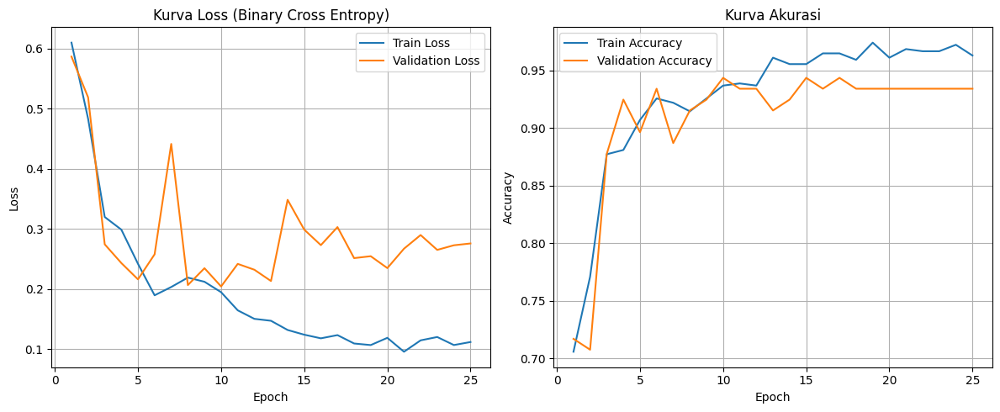

In [73]:
# torch, nn, dan matplotlib.pyplot sudah diimpor sebelumnya; hanya tambahkan modul baru
import torch.optim as optim
import copy
import time

# ==========================================
# 1. Hyperparameters, Optimizer & Loss
# ==========================================
EPOCHS = 30
LEARNING_RATE = 2e-4
PATIENCE = 15 # Toleransi epoch untuk Early Stopping

# Deteksi perangkat komputasi (GPU/CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Menggunakan perangkat: {device}")

# Inisialisasi model dan pindahkan ke perangkat
model = BaselineCNN().to(device)

# Loss Function dan Optimizer
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2)

# ==========================================
# 2. Fungsi Training & Validation
# ==========================================
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, patience):
    start_time = time.time()

    # Menyimpan bobot model terbaik
    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_loss = float('inf')
    epochs_no_improve = 0

    # Rekap histori untuk visualisasi
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print("-" * 15)

        # ---------------------------
        # FASE TRAINING
        # ---------------------------
        model.train() # Set model ke mode training
        running_loss = 0.0
        correct_preds = 0
        total_samples = 0

        for inputs, labels, _ in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad() # Reset gradien

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # Backward pass & optimasi
            loss.backward()
            optimizer.step()

            # Kalkulasi metrik
            running_loss += loss.item() * inputs.size(0)
            preds = (outputs >= 0.5).float()
            correct_preds += torch.sum(preds == labels.data)
            total_samples += inputs.size(0)

        epoch_train_loss = running_loss / total_samples
        epoch_train_acc = correct_preds.double() / total_samples

        history['train_loss'].append(epoch_train_loss)
        history['train_acc'].append(epoch_train_acc.item())

        # ---------------------------
        # FASE VALIDATION
        # ---------------------------
        model.eval() # Set model ke mode evaluasi
        val_running_loss = 0.0
        val_correct_preds = 0
        val_total_samples = 0

        with torch.no_grad(): # Matikan perhitungan gradien
            for inputs, labels, _ in val_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                loss = criterion(outputs, labels)

                val_running_loss += loss.item() * inputs.size(0)
                preds = (outputs >= 0.5).float()
                val_correct_preds += torch.sum(preds == labels.data)
                val_total_samples += inputs.size(0)

        epoch_val_loss = val_running_loss / val_total_samples
        scheduler.step(epoch_val_loss)
        epoch_val_acc = val_correct_preds.double() / val_total_samples

        history['val_loss'].append(epoch_val_loss)
        history['val_acc'].append(epoch_val_acc.item())

        print(f"Train Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")
        print(f"Val Loss: {epoch_val_loss:.4f} | Val Acc: {epoch_val_acc:.4f}")

        # ---------------------------
        # EARLY STOPPING & SAVING
        # ---------------------------
        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
            torch.save(model.state_dict(), 'best_baseline_cnn.pth')
            print(">> Model terbaik diperbarui")
        else:
            epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f">> Early stopping terpicu pada epoch {epoch+1}!")
            break

        print()

    time_elapsed = time.time() - start_time
    print(f"Training selesai dalam {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s")

    # Memuat kembali bobot model dengan val_loss terendah
    model.load_state_dict(best_model_wts)
    return model, history

# ==========================================
# 3. Visualisasi Kurva Performa
# ==========================================
def plot_training_history(history):
    epochs = range(1, len(history['train_loss']) + 1)

    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['val_loss'], label='Validation Loss')
    plt.title('Kurva Loss (Binary Cross Entropy)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot Akurasi
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['train_acc'], label='Train Accuracy')
    plt.plot(epochs, history['val_acc'], label='Validation Accuracy')
    plt.title('Kurva Akurasi')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# ==========================================
# 4. Eksekusi Skrip
# ==========================================
trained_model, training_history = train_model(
    model=model,
    train_loader=train_loader, # Data training seimbang & diproses
    val_loader=val_loader,     # Data validasi diproses
    criterion=criterion,
    optimizer=optimizer,
    num_epochs=EPOCHS,
    patience=PATIENCE
)

# Menampilkan kurva
plot_training_history(training_history)

# Quality-Aware Modelling

In [76]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class QualityAwareCNN(nn.Module):
    def __init__(self):
        super(QualityAwareCNN, self).__init__()

        # --- BLOK EKSTRAKSI GAMBAR (Sama seperti Baseline) ---
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(16)
        self.pool1 = nn.MaxPool2d(2, 2)

        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(32)
        self.pool2 = nn.MaxPool2d(2, 2)

        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(64)
        self.pool3 = nn.MaxPool2d(2, 2)

        self.conv4 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(128)
        self.pool4 = nn.MaxPool2d(2, 2)

        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(256)
        self.pool5 = nn.MaxPool2d(2, 2)

        self.spatial_dropout = nn.Dropout2d(p=0.2)
        self.adaptive_pool = nn.AdaptiveAvgPool2d((4, 4))

        # --- BLOK EKSTRAKSI KUALITAS ---
        # Memperluas 1 nilai skalar (Quality Score) menjadi 16 node fitur
        self.quality_fc = nn.Linear(1, 16)

        # --- BLOK KLASIFIKASI GABUNGAN ---
        # 256 * 4 * 4 (Fitur Gambar = 4096 node) + 16 (Fitur Kualitas) = 4112 node
        self.fc1 = nn.Linear(4096 + 16, 512)
        self.dropout = nn.Dropout(p=0.5)
        self.fc2 = nn.Linear(512, 1)

    def forward(self, x, quality):
        # 1. Proses Gambar
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.pool3(F.relu(self.bn3(self.conv3(x))))

        x = self.pool4(F.relu(self.bn4(self.conv4(x))))
        x = self.spatial_dropout(x)

        x = self.pool5(F.relu(self.bn5(self.conv5(x))))
        x = self.spatial_dropout(x)

        x = self.adaptive_pool(x)
        img_features = torch.flatten(x, 1)

        # 2. Proses Quality Score
        # Normalisasi skor 1-10 menjadi 0.1 - 1.0 agar tidak mendominasi gradien
        quality_scaled = quality.view(-1, 1) / 10.0
        qual_features = F.relu(self.quality_fc(quality_scaled))

        # 3. Penggabungan (Concatenation)
        combined_features = torch.cat((img_features, qual_features), dim=1)

        # 4. Klasifikasi Akhir
        out = F.relu(self.fc1(combined_features))
        out = self.dropout(out)
        out = torch.sigmoid(self.fc2(out))

        return out.squeeze(-1)

In [77]:
class QualityWeightedBCELoss(nn.Module):
    def __init__(self):
        super(QualityWeightedBCELoss, self).__init__()
        # reduction='none' mencegah PyTorch merata-ratakan loss secara otomatis
        self.bce = nn.BCELoss(reduction='none')

    def forward(self, predictions, targets, quality_scores):
        # Hitung loss dasar per sampel gambar
        base_loss = self.bce(predictions, targets)

        # Konversi skor kualitas menjadi bobot penalti (skala 0.1 - 1.0)
        # torch.clamp memastikan gambar terburuk pun tetap memiliki loss minimal 0.1
        weights = quality_scores / 10.0
        weights = torch.clamp(weights, min=0.1)

        # Kalikan loss dengan bobot kualitas, lalu rata-ratakan untuk batch tersebut
        weighted_loss = base_loss * weights

        return weighted_loss.mean()

In [78]:
# 1. Inisialisasi Model dan Loss Kustom
model_qa = QualityAwareCNN().to(device)
criterion_qa = QualityWeightedBCELoss()
optimizer_qa = optim.Adam(model_qa.parameters(), lr=5e-5, weight_decay=1e-4)
scheduler_qa = optim.lr_scheduler.ReduceLROnPlateau(optimizer_qa, mode='min', factor=0.5, patience=2)

# 2. Fungsi Training yang Diperbarui
def train_quality_aware_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs, patience):
    import time
    import copy

    start_time = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_loss = float('inf')
    epochs_no_improve = 0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print("-" * 15)

        # --- FASE TRAINING ---
        model.train()
        running_loss = 0.0
        correct_preds = 0
        total_samples = 0

        for inputs, labels, qualities in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            qualities = qualities.to(device) # Ambil nilai kualitas dari DataLoader

            optimizer.zero_grad()

            # Masukkan gambar dan kualitas ke model
            outputs = model(inputs, qualities)

            # Masukkan prediksi, target, dan kualitas ke Loss Function
            loss = criterion(outputs, labels, qualities)

            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            preds = (outputs >= 0.5).float()
            correct_preds += torch.sum(preds == labels.data)
            total_samples += inputs.size(0)

        epoch_train_loss = running_loss / total_samples
        epoch_train_acc = correct_preds.double() / total_samples

        history['train_loss'].append(epoch_train_loss)
        history['train_acc'].append(epoch_train_acc.item())

        # --- FASE VALIDATION ---
        model.eval()
        val_running_loss = 0.0
        val_correct_preds = 0
        val_total_samples = 0

        with torch.no_grad():
            for inputs, labels, qualities in val_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)
                qualities = qualities.to(device)

                outputs = model(inputs, qualities)
                loss = criterion(outputs, labels, qualities)

                val_running_loss += loss.item() * inputs.size(0)
                preds = (outputs >= 0.5).float()
                val_correct_preds += torch.sum(preds == labels.data)
                val_total_samples += inputs.size(0)

        epoch_val_loss = val_running_loss / val_total_samples
        epoch_val_acc = val_correct_preds.double() / val_total_samples

        history['val_loss'].append(epoch_val_loss)
        history['val_acc'].append(epoch_val_acc.item())

        print(f"Train Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")
        print(f"Val Loss: {epoch_val_loss:.4f} | Val Acc: {epoch_val_acc:.4f}")

        scheduler.step()

        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
            torch.save(model.state_dict(), 'best_quality_aware_cnn.pth')
            print(">> Model terbaik diperbarui")
        else:
            epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f">> Early stopping terpicu pada epoch {epoch+1}!")
            break
        print()

    time_elapsed = time.time() - start_time
    print(f"Training selesai dalam {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s")
    model.load_state_dict(best_model_wts)
    return model, history



Menggunakan perangkat: cpu
Epoch 1/30
---------------
Train Loss: 0.3670 | Train Acc: 0.7151
Val Loss: 0.3684 | Val Acc: 0.7170
>> Model terbaik diperbarui

Epoch 2/30
---------------
Train Loss: 0.3066 | Train Acc: 0.7430
Val Loss: 0.3138 | Val Acc: 0.7170
>> Model terbaik diperbarui

Epoch 3/30
---------------
Train Loss: 0.2888 | Train Acc: 0.7635
Val Loss: 0.2529 | Val Acc: 0.7547
>> Model terbaik diperbarui

Epoch 4/30
---------------
Train Loss: 0.2460 | Train Acc: 0.8119
Val Loss: 0.2260 | Val Acc: 0.8113
>> Model terbaik diperbarui

Epoch 5/30
---------------
Train Loss: 0.2176 | Train Acc: 0.8380
Val Loss: 0.1870 | Val Acc: 0.8774
>> Model terbaik diperbarui

Epoch 6/30
---------------
Train Loss: 0.1803 | Train Acc: 0.8715
Val Loss: 0.1703 | Val Acc: 0.9057
>> Model terbaik diperbarui

Epoch 7/30
---------------
Train Loss: 0.1907 | Train Acc: 0.8734
Val Loss: 0.1636 | Val Acc: 0.8962
>> Model terbaik diperbarui

Epoch 8/30
---------------
Train Loss: 0.1447 | Train Acc: 0.92

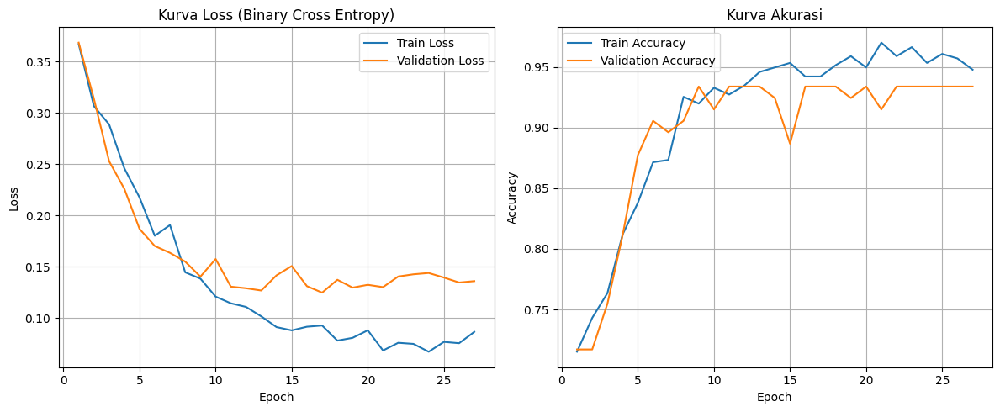

In [80]:
#  EKSEKUSI TRAINING (QUALITY-AWARE MODEL)
EPOCHS = 30
LEARNING_RATE = 5e-5 # Menggunakan learning rate yang lebih lambat untuk stabilitas
PATIENCE = 10

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Menggunakan perangkat: {device}")

# Inisialisasi Model, Loss Kustom, dan Optimizer
model_qa = QualityAwareCNN().to(device)
criterion_qa = QualityWeightedBCELoss()
optimizer_qa = optim.Adam(model_qa.parameters(), lr=LEARNING_RATE, weight_decay=1e-4)
scheduler_qa = optim.lr_scheduler.ReduceLROnPlateau(optimizer_qa, mode='min', factor=0.5, patience=2)

# Perbaikan fungsi training: Pastikan scheduler.step() menerima metrik loss
def train_quality_aware_model_fixed(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs, patience):
    import time
    import copy

    start_time = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_loss = float('inf')
    epochs_no_improve = 0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print("-" * 15)

        model.train()
        running_loss = 0.0
        correct_preds = 0
        total_samples = 0

        for inputs, labels, qualities in train_loader:
            inputs, labels, qualities = inputs.to(device), labels.to(device), qualities.to(device)
            optimizer.zero_grad()
            outputs = model(inputs, qualities)
            loss = criterion(outputs, labels, qualities)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
            preds = (outputs >= 0.5).float()
            correct_preds += torch.sum(preds == labels.data)
            total_samples += inputs.size(0)

        epoch_train_loss = running_loss / total_samples
        epoch_train_acc = correct_preds.double() / total_samples
        history['train_loss'].append(epoch_train_loss)
        history['train_acc'].append(epoch_train_acc.item())

        model.eval()
        val_running_loss = 0.0
        val_correct_preds = 0
        val_total_samples = 0

        with torch.no_grad():
            for inputs, labels, qualities in val_loader:
                inputs, labels, qualities = inputs.to(device), labels.to(device), qualities.to(device)
                outputs = model(inputs, qualities)
                loss = criterion(outputs, labels, qualities)
                val_running_loss += loss.item() * inputs.size(0)
                preds = (outputs >= 0.5).float()
                val_correct_preds += torch.sum(preds == labels.data)
                val_total_samples += inputs.size(0)

        epoch_val_loss = val_running_loss / val_total_samples
        epoch_val_acc = val_correct_preds.double() / val_total_samples
        history['val_loss'].append(epoch_val_loss)
        history['val_acc'].append(epoch_val_acc.item())

        print(f"Train Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")
        print(f"Val Loss: {epoch_val_loss:.4f} | Val Acc: {epoch_val_acc:.4f}")

        # FIX: Melewatkan epoch_val_loss ke scheduler
        scheduler.step(epoch_val_loss)

        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
            torch.save(model.state_dict(), 'best_quality_aware_cnn.pth')
            print(">> Model terbaik diperbarui")
        else:
            epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f">> Early stopping terpicu pada epoch {epoch+1}!")
            break
        print()

    time_elapsed = time.time() - start_time
    print(f"Training selesai dalam {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s")
    model.load_state_dict(best_model_wts)
    return model, history

# Eksekusi training
trained_qa_model, qa_history = train_quality_aware_model_fixed(
    model=model_qa,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion_qa,
    optimizer=optimizer_qa,
    scheduler=scheduler_qa,
    num_epochs=EPOCHS,
    patience=PATIENCE
)

plot_training_history(qa_history)

# Evaluation

HASIL EVALUASI MODEL PADA TEST SET
--- Metrik Global (Semua Kualitas) ---
Jumlah Sampel : 104
F1-Score      : 0.9620
Sensitivitas  : 0.9620
Spesifisitas  : 0.8800
ROC-AUC       : 0.9772
Confusion Mat : TP=76, FP=3, TN=22, FN=3
------------------------------

--- Metrik Kualitas Rendah (Skor 1-3) ---
Jumlah Sampel : 5
F1-Score      : 0.8571
Sensitivitas  : 0.7500
Spesifisitas  : 1.0000
ROC-AUC       : 1.0000
Confusion Mat : TP=3, FP=0, TN=1, FN=1
------------------------------

--- Metrik Kualitas Menengah (Skor 4-7) ---
Jumlah Sampel : 91
F1-Score      : 0.9635
Sensitivitas  : 0.9706
Spesifisitas  : 0.8696
ROC-AUC       : 0.9751
Confusion Mat : TP=66, FP=3, TN=20, FN=2
------------------------------

--- Metrik Kualitas Tinggi (Skor 8-10) ---
Jumlah Sampel : 8
F1-Score      : 1.0000
Sensitivitas  : 1.0000
Spesifisitas  : 1.0000
ROC-AUC       : 1.0000
Confusion Mat : TP=7, FP=0, TN=1, FN=0
------------------------------



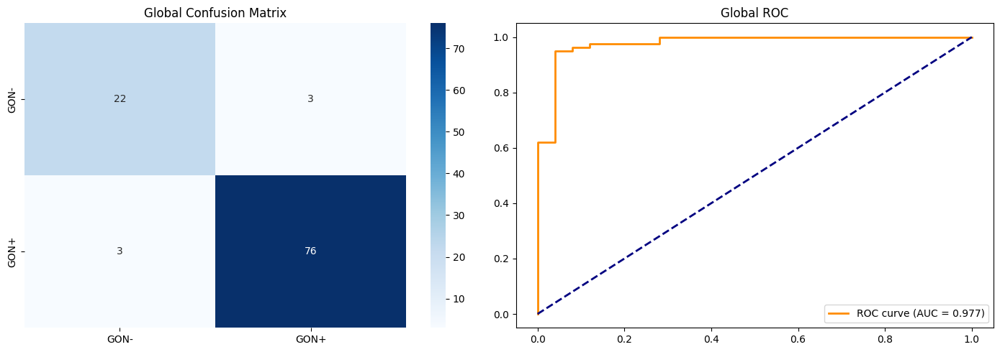

In [106]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, f1_score, roc_auc_score, roc_curve, classification_report

# 1. FUNGSI INFERENSI PADA DATA UJI (DIUPDATE UNTUK MENDUKUNG BASELINE & QA)
def get_predictions(model, test_loader, is_quality_aware=False):
    model.eval()
    all_preds_prob = []
    all_preds_bin = []
    all_labels = []
    all_qualities = []

    with torch.no_grad():
        for inputs, labels, qualities in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            qualities = qualities.to(device)

            # Percabangan input: Baseline hanya butuh gambar, QA butuh gambar + kualitas
            if is_quality_aware:
                outputs = model(inputs, qualities)
            else:
                outputs = model(inputs)

            preds_bin = (outputs >= 0.5).float()

            all_preds_prob.extend(outputs.cpu().numpy())
            all_preds_bin.extend(preds_bin.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_qualities.extend(qualities.cpu().numpy())

    return np.array(all_labels), np.array(all_preds_bin), np.array(all_preds_prob), np.array(all_qualities)

# 2. FUNGSI PERHITUNGAN METRIK
def calculate_and_print_metrics(y_true, y_pred_bin, y_pred_prob, group_name="Global"):
    if len(y_true) == 0:
        print(f"--- Metrik {group_name} ---")
        print("Tidak ada sampel pada rentang kualitas ini.\n")
        return None

    cm = confusion_matrix(y_true, y_pred_bin, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
    f1 = f1_score(y_true, y_pred_bin, zero_division=0)

    try:
        auc = roc_auc_score(y_true, y_pred_prob)
    except ValueError:
        auc = float('nan')

    print(f"--- Metrik {group_name} ---")
    print(f"Jumlah Sampel : {len(y_true)}")
    print(f"F1-Score      : {f1:.4f}")
    print(f"Sensitivitas  : {sensitivity:.4f}")
    print(f"Spesifisitas  : {specificity:.4f}")
    print(f"ROC-AUC       : {auc:.4f}")
    print(f"Confusion Mat : TP={tp}, FP={fp}, TN={tn}, FN={fn}")
    print("-" * 30 + "\n")

    return cm, auc

# 3. EKSEKUSI EVALUASI
# Gunakan is_quality_aware=False untuk trained_model (Baseline)
y_true, y_pred_bin, y_pred_prob, q_scores = get_predictions(trained_model, test_loader, is_quality_aware=False)

print("HASIL EVALUASI MODEL PADA TEST SET\n" + "="*50)

# A. Evaluasi Global
cm_global, auc_global = calculate_and_print_metrics(y_true, y_pred_bin, y_pred_prob, "Global (Semua Kualitas)")

# B. Evaluasi Per Kualitas
mask_low = (q_scores >= 1) & (q_scores <= 4)
calculate_and_print_metrics(y_true[mask_low], y_pred_bin[mask_low], y_pred_prob[mask_low], "Kualitas Rendah (Skor 1-3)")

mask_med = (q_scores > 4) & (q_scores <= 7)
calculate_and_print_metrics(y_true[mask_med], y_pred_bin[mask_med], y_pred_prob[mask_med], "Kualitas Menengah (Skor 4-7)")

mask_high = (q_scores > 7) & (q_scores <= 10)
calculate_and_print_metrics(y_true[mask_high], y_pred_bin[mask_high], y_pred_prob[mask_high], "Kualitas Tinggi (Skor 8-10)")

# 4. VISUALISASI
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(cm_global, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=['GON-', 'GON+'], yticklabels=['GON-', 'GON+'])
axes[0].set_title('Global Confusion Matrix')

fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
axes[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {auc_global:.3f})')
axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
axes[1].set_title('Global ROC')
axes[1].legend(loc="lower right")
plt.tight_layout()
plt.show()

HASIL EVALUASI MODEL QA PADA TEST SET
--- Metrik Global (Semua Kualitas) ---
Jumlah Sampel : 104
F1-Score      : 0.9625
Sensitivitas  : 0.9747
Spesifisitas  : 0.8400
ROC-AUC       : 0.9570
Confusion Mat : TP=77, FP=4, TN=21, FN=2
------------------------------

--- Metrik Kualitas Rendah (Skor 1-3) ---
Jumlah Sampel : 5
F1-Score      : 0.8571
Sensitivitas  : 0.7500
Spesifisitas  : 1.0000
ROC-AUC       : 1.0000
Confusion Mat : TP=3, FP=0, TN=1, FN=1
------------------------------

--- Metrik Kualitas Menengah (Skor 4-7) ---
Jumlah Sampel : 91
F1-Score      : 0.9640
Sensitivitas  : 0.9853
Spesifisitas  : 0.8261
ROC-AUC       : 0.9540
Confusion Mat : TP=67, FP=4, TN=19, FN=1
------------------------------

--- Metrik Kualitas Tinggi (Skor 8-10) ---
Jumlah Sampel : 8
F1-Score      : 1.0000
Sensitivitas  : 1.0000
Spesifisitas  : 1.0000
ROC-AUC       : 1.0000
Confusion Mat : TP=7, FP=0, TN=1, FN=0
------------------------------



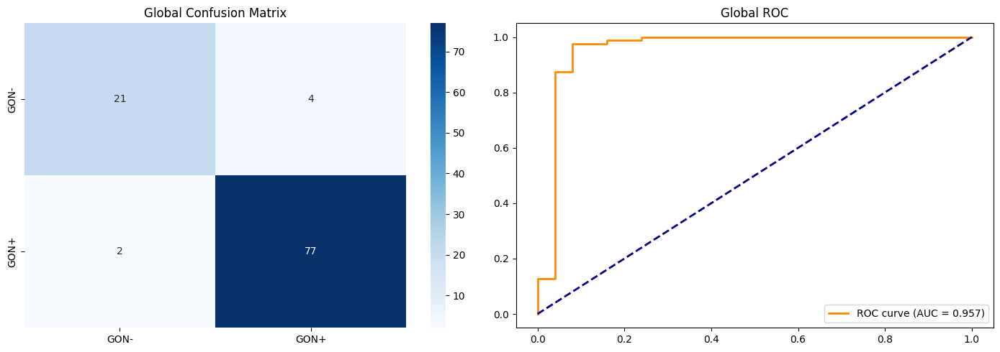

In [107]:
# 3. EKSEKUSI EVALUASI
# Gunakan is_quality_aware=False untuk trained_model (Baseline)
y_true, y_pred_bin, y_pred_prob, q_scores = get_predictions(trained_qa_model, test_loader, is_quality_aware=True)

print("HASIL EVALUASI MODEL QA PADA TEST SET\n" + "="*50)

# A. Evaluasi Global
cm_global, auc_global = calculate_and_print_metrics(y_true, y_pred_bin, y_pred_prob, "Global (Semua Kualitas)")

# B. Evaluasi Per Kualitas
mask_low = (q_scores >= 1) & (q_scores <= 4)
calculate_and_print_metrics(y_true[mask_low], y_pred_bin[mask_low], y_pred_prob[mask_low], "Kualitas Rendah (Skor 1-3)")

mask_med = (q_scores > 4) & (q_scores <= 7)
calculate_and_print_metrics(y_true[mask_med], y_pred_bin[mask_med], y_pred_prob[mask_med], "Kualitas Menengah (Skor 4-7)")

mask_high = (q_scores > 7) & (q_scores <= 10)
calculate_and_print_metrics(y_true[mask_high], y_pred_bin[mask_high], y_pred_prob[mask_high], "Kualitas Tinggi (Skor 8-10)")

# 4. VISUALISASI
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(cm_global, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=['GON-', 'GON+'], yticklabels=['GON-', 'GON+'])
axes[0].set_title('Global Confusion Matrix')

fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
axes[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {auc_global:.3f})')
axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
axes[1].set_title('Global ROC')
axes[1].legend(loc="lower right")
plt.tight_layout()
plt.show()

In [108]:
from IPython.display import display

# 1. FUNGSI INFERENSI (MENDUKUNG KEDUA MODEL)
def get_predictions(model, test_loader, is_quality_aware=False):
    model.eval()
    all_preds_prob = []
    all_preds_bin = []
    all_labels = []
    all_qualities = []

    with torch.no_grad():
        for inputs, labels, qualities in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            qualities = qualities.to(device)

            # Percabangan input berdasarkan tipe model
            if is_quality_aware:
                outputs = model(inputs, qualities)
            else:
                outputs = model(inputs)

            preds_bin = (outputs >= 0.5).float()

            all_preds_prob.extend(outputs.cpu().numpy())
            all_preds_bin.extend(preds_bin.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_qualities.extend(qualities.cpu().numpy())

    return np.array(all_labels), np.array(all_preds_bin), np.array(all_preds_prob), np.array(all_qualities)

# 2. FUNGSI PERHITUNGAN METRIK KE FORMAT DICTIONARY
def calculate_metrics_dict(y_true, y_pred_bin, y_pred_prob, model_name, group_name):
    # Penanganan jika subset tidak memiliki data
    if len(y_true) == 0:
        return {
            'Model': model_name, 'Kualitas': group_name, 'N': 0,
            'TP': np.nan, 'FP': np.nan, 'TN': np.nan, 'FN': np.nan,
            'F1-Score': np.nan, 'Sensitivitas': np.nan, 'Spesifisitas': np.nan, 'ROC-AUC': np.nan
        }

    cm = confusion_matrix(y_true, y_pred_bin, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
    f1 = f1_score(y_true, y_pred_bin, zero_division=0)

    try:
        auc = roc_auc_score(y_true, y_pred_prob)
    except ValueError:
        auc = np.nan

    return {
        'Model': model_name,
        'Kualitas': group_name,
        'N': len(y_true),
        'TP': int(tp),
        'FP': int(fp),
        'TN': int(tn),
        'FN': int(fn),
        'F1-Score': round(f1, 4),
        'Sensitivitas': round(sensitivity, 4),
        'Spesifisitas': round(specificity, 4),
        'ROC-AUC': round(auc, 4)
    }

# 3. EKSEKUSI PENGUMPULAN DATA & RENDER TABEL
y_true_b, y_pred_bin_b, y_pred_prob_b, q_scores_b = get_predictions(trained_model, test_loader, is_quality_aware=False)
y_true_q, y_pred_bin_q, y_pred_prob_q, q_scores_q = get_predictions(trained_qa_model, test_loader, is_quality_aware=True)

results = []

def evaluate_and_append(y_t, y_p_b, y_p_p, q_s, model_name):
    # Global
    results.append(calculate_metrics_dict(y_t, y_p_b, y_p_p, model_name, 'Global (Semua)'))

    # Rendah
    mask = (q_s >= 1) & (q_s <= 4)
    results.append(calculate_metrics_dict(y_t[mask], y_p_b[mask], y_p_p[mask], model_name, 'Rendah (1-4)'))

    # Menengah
    mask = (q_s > 4) & (q_s <= 7)
    results.append(calculate_metrics_dict(y_t[mask], y_p_b[mask], y_p_p[mask], model_name, 'Menengah (4-7)'))

    # Tinggi
    mask = (q_s > 7) & (q_s <= 10)
    results.append(calculate_metrics_dict(y_t[mask], y_p_b[mask], y_p_p[mask], model_name, 'Tinggi (8-10)'))

evaluate_and_append(y_true_b, y_pred_bin_b, y_pred_prob_b, q_scores_b, 'Baseline CNN')
evaluate_and_append(y_true_q, y_pred_bin_q, y_pred_prob_q, q_scores_q, 'Quality-Aware CNN')

# Render hasil dalam bentuk DataFrame agar formatnya rapi di notebook
df_results = pd.DataFrame(results)
display(df_results)

,Model,Kualitas,N,TP,FP,TN,FN,F1-Score,Sensitivitas,Spesifisitas,ROC-AUC
0,Baseline CNN,Global (Semua),104,76,3,22,3,0.9620,0.9620,0.8800,0.9772
1,Baseline CNN,Rendah (1-4),5,3,0,1,1,0.8571,0.7500,1.0000,1.0000
2,Baseline CNN,Menengah (4-7),91,66,3,20,2,0.9635,0.9706,0.8696,0.9751
3,Baseline CNN,Tinggi (8-10),8,7,0,1,0,1.0000,1.0000,1.0000,1.0000
4,Quality-Aware CNN,Global (Semua),104,77,4,21,2,0.9625,0.9747,0.8400,0.9570
5,Quality-Aware CNN,Rendah (1-4),5,3,0,1,1,0.8571,0.7500,1.0000,1.0000
6,Quality-Aware CNN,Menengah (4-7),91,67,4,19,1,0.9640,0.9853,0.8261,0.9540
7,Quality-Aware CNN,Tinggi (8-10),8,7,0,1,0,1.0000,1.0000,1.0000,1.0000


Error Analysis and Interpretation

--- MEMULAI ANALISIS ERROR PADA MODEL QUALITY-AWARE ---
Total False Negatives (Prediksi Normal, Asli Glaukoma): 2
Total False Positives (Prediksi Glaukoma, Asli Normal): 4

--- VISUALISASI FALSE NEGATIVES ---


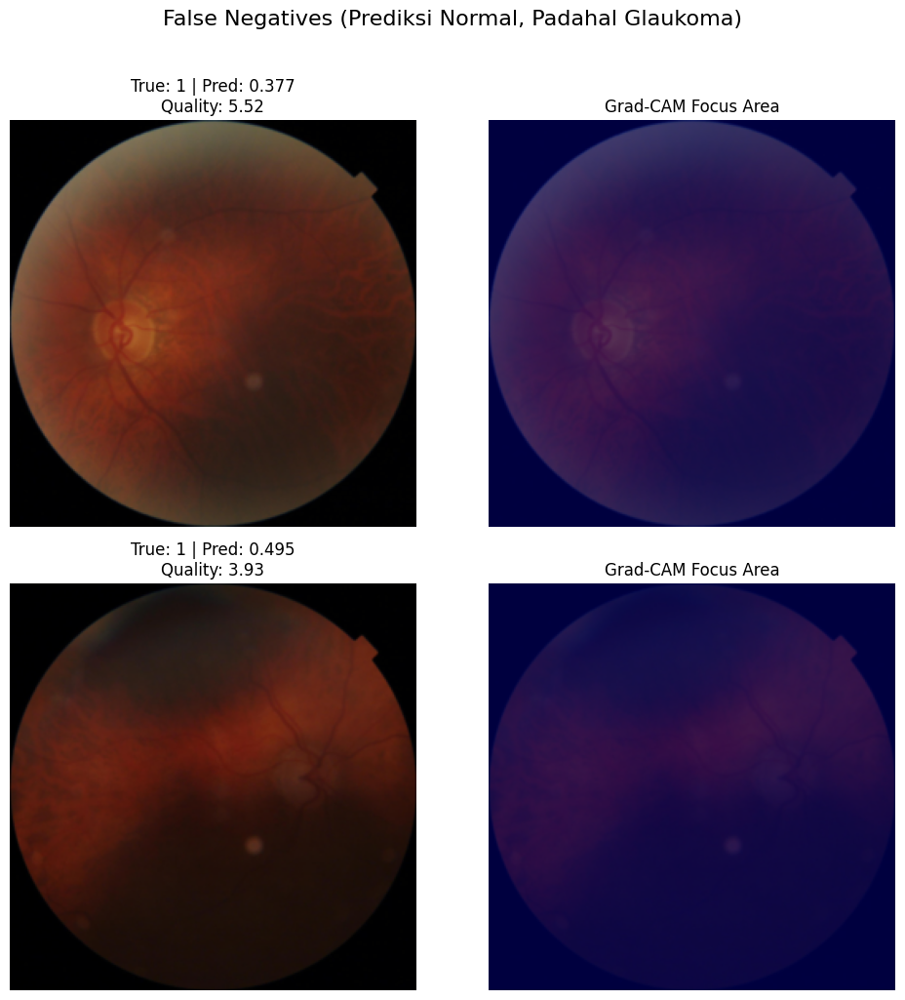

--- VISUALISASI FALSE POSITIVES ---


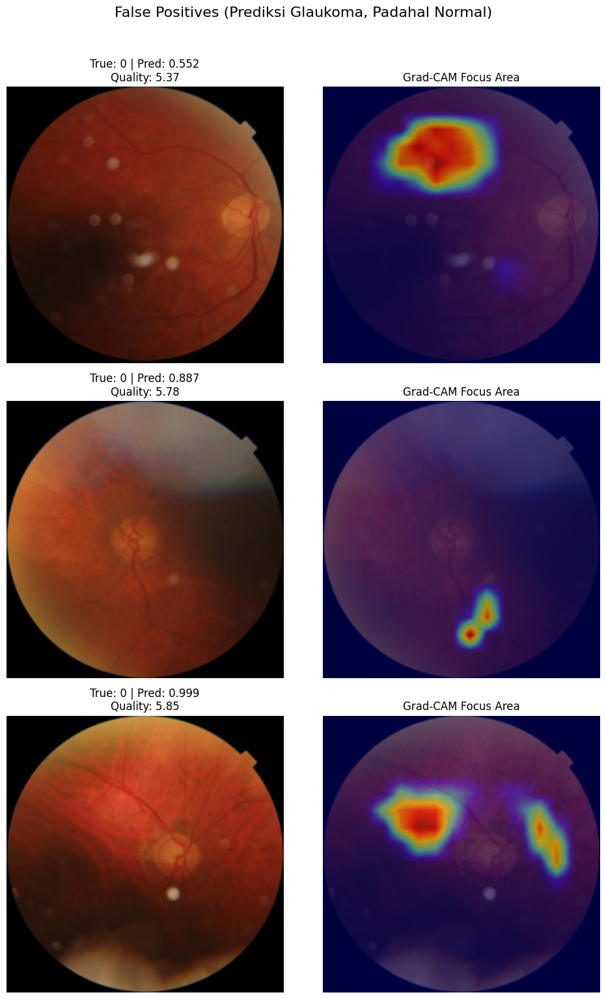

In [84]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

# ==========================================
# 1. KELAS GRAD-CAM (Gradient-weighted Class Activation Mapping)
# ==========================================
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Mendaftarkan hook untuk menangkap output (aktivasi) dan gradien
        self.target_layer.register_forward_hook(self.save_activations)
        self.target_layer.register_full_backward_hook(self.save_gradients)

    def save_activations(self, module, input, output):
        self.activations = output.detach()

    def save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate_cam(self, input_tensor, quality_tensor=None):
        self.model.eval()
        self.model.zero_grad()

        # Forward pass (mendukung QualityAwareCNN maupun BaselineCNN)
        if quality_tensor is not None:
            output = self.model(input_tensor, quality_tensor)
        else:
            output = self.model(input_tensor)

        # Backward pass untuk menghitung gradien
        output.backward(retain_graph=True)

        # Global Average Pooling pada gradien
        weights = torch.mean(self.gradients, dim=[2, 3], keepdim=True)

        # Kalikan feature maps (aktivasi) dengan bobot gradien
        cam = torch.sum(weights * self.activations, dim=1, keepdim=True)

        # Terapkan ReLU untuk hanya mengambil area piksel yang berkontribusi positif
        cam = F.relu(cam)

        # Normalisasi heatmap ke rentang 0 - 1
        cam = cam.squeeze().cpu().numpy()
        cam = cam - np.min(cam)
        cam_max = np.max(cam)
        if cam_max != 0:
            cam = cam / cam_max

        return cam

# ==========================================
# 2. FUNGSI ANALISIS ERROR (FP & FN) DENGAN GRAD-CAM
# ==========================================
def analyze_errors(dataset, y_true, y_pred_bin, y_pred_prob, q_scores, model, num_samples=3):
    # Identifikasi indeks kasus yang salah
    fn_indices = np.where((y_true == 1) & (y_pred_bin == 0))[0]
    fp_indices = np.where((y_true == 0) & (y_pred_bin == 1))[0]

    print(f"Total False Negatives (Prediksi Normal, Asli Glaukoma): {len(fn_indices)}")
    print(f"Total False Positives (Prediksi Glaukoma, Asli Normal): {len(fp_indices)}\n")

    # Inisialisasi Grad-CAM pada layer konvolusi terakhir (conv5)
    # Perbaikan: Menggunakan nama kelas yang benar 'GradCAM'
    grad_cam = GradCAM(model, model.conv5)

    def plot_samples(indices, title):
        if len(indices) == 0:
            print(f"Tidak ada kasus untuk {title}")
            return

        samples_to_plot = min(len(indices), num_samples)
        fig, axes = plt.subplots(samples_to_plot, 2, figsize=(10, 5 * samples_to_plot))
        if samples_to_plot == 1: axes = [axes]

        for i in range(samples_to_plot):
            idx = indices[i]
            img_tensor, label, quality = dataset[idx]

            # Siapkan input untuk model
            img_input = img_tensor.unsqueeze(0).to(device)
            # Model Quality-Aware butuh input kualitas
            qual_input = torch.tensor([quality], dtype=torch.float32).to(device)

            # Generate Heatmap
            cam = grad_cam.generate_cam(img_input, qual_input)

            # Format gambar asli (C,H,W -> H,W,C)
            # Konversi gambar asli dari (Channels, Height, Width) ke (Height, Width, Channels)
            img_show = img_tensor.permute(1, 2, 0).numpy()

            # PROSES DENORMALISASI (Wajib agar visualisasi kembali normal)
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img_show = std * img_show + mean
            img_show = np.clip(img_show, 0, 1) # Memastikan nilai piksel tetap di rentang valid 0-1
            cam_resized = cv2.resize(cam, (img_show.shape[1], img_show.shape[0]))

            # Plot Gambar Asli
            axes[i][0].imshow(img_show)
            axes[i][0].set_title(f"True: {int(label.item())} | Pred: {y_pred_prob[idx]:.3f}\nQuality: {q_scores[idx]:.2f}")
            axes[i][0].axis('off')

            # Plot Overlay Heatmap
            axes[i][1].imshow(img_show)
            axes[i][1].imshow(cam_resized, cmap='jet', alpha=0.5)
            axes[i][1].set_title("Grad-CAM Focus Area")
            axes[i][1].axis('off')

        fig.suptitle(title, fontsize=16, y=1.02)
        plt.tight_layout()
        plt.show()

    print("--- VISUALISASI FALSE NEGATIVES ---")
    plot_samples(fn_indices, "False Negatives (Prediksi Normal, Padahal Glaukoma)")

    print("--- VISUALISASI FALSE POSITIVES ---")
    plot_samples(fp_indices, "False Positives (Prediksi Glaukoma, Padahal Normal)")

# ==========================================
# 3. EKSEKUSI VISUALISASI
# ==========================================
print("--- MEMULAI ANALISIS ERROR PADA MODEL QUALITY-AWARE ---")
analyze_errors(test_dataset, y_true_q, y_pred_bin_q, y_pred_prob_q, q_scores_q, trained_qa_model, num_samples=3)

Total True Positives (Asli Glaukoma, Ditebak Glaukoma): 77
Total True Negatives (Asli Normal, Ditebak Normal): 21

--- VISUALISASI TRUE POSITIVES ---


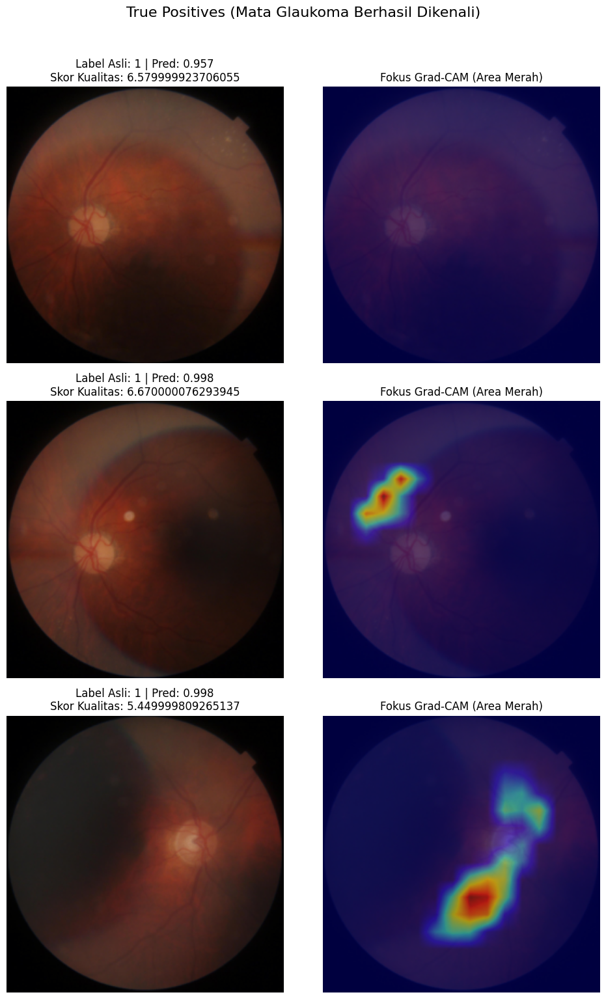

--- VISUALISASI TRUE NEGATIVES ---


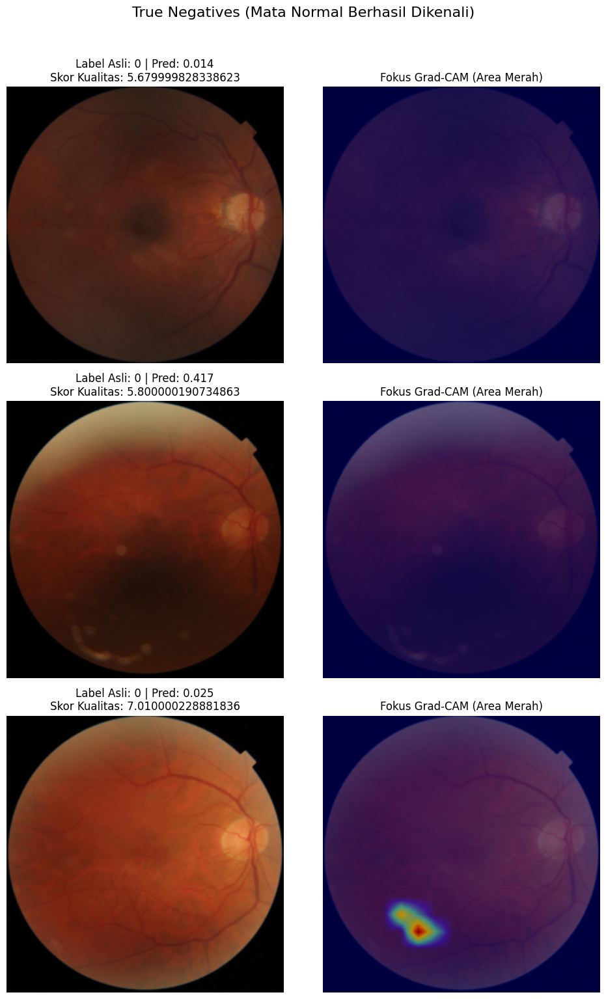

In [86]:
# ==========================================
# FUNGSI VISUALISASI KEBERHASILAN (TP & TN)
# ==========================================
def visualize_gradcam_successes(dataset, y_true, y_pred_bin, y_pred_prob, q_scores, model, target_layer, is_quality_aware=True, num_samples=3):
    # Cari indeks untuk True Positives (TP) dan True Negatives (TN)
    tp_indices = np.where((y_true == 1) & (y_pred_bin == 1))[0]
    tn_indices = np.where((y_true == 0) & (y_pred_bin == 0))[0]

    print(f"Total True Positives (Asli Glaukoma, Ditebak Glaukoma): {len(tp_indices)}")
    print(f"Total True Negatives (Asli Normal, Ditebak Normal): {len(tn_indices)}\n")

    # Inisialisasi dari kelas GradCAM sebelumnya
    grad_cam = GradCAM(model, target_layer)

    def plot_cases(indices, title):
        if len(indices) == 0:
            print(f"Tidak ada kasus untuk {title}")
            return

        samples = min(len(indices), num_samples)
        fig, axes = plt.subplots(samples, 2, figsize=(10, 5 * samples))
        if samples == 1: axes = [axes] # Pastikan array axes berbentuk 2D

        for i in range(samples):
            idx = indices[i]
            img_tensor, label, quality = dataset[idx]

            # Tambahkan dimensi batch
            img_input = img_tensor.unsqueeze(0).to(device)
            qual_input = torch.tensor([quality], dtype=torch.float32).to(device) if is_quality_aware else None

            # Generate Heatmap
            cam = grad_cam.generate_cam(img_input, qual_input)

            # Konversi gambar asli dari (Channels, Height, Width) ke (Height, Width, Channels)
            img_show = img_tensor.permute(1, 2, 0).numpy()

            # PROSES DENORMALISASI (Wajib agar visualisasi kembali normal)
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img_show = std * img_show + mean
            img_show = np.clip(img_show, 0, 1) # Memastikan nilai piksel tetap di rentang valid 0-1

            # Ubah ukuran heatmap agar sama dengan gambar asli (256x256)
            cam_resized = cv2.resize(cam, (img_show.shape[1], img_show.shape[0]))

            # Gambar Asli
            axes[i][0].imshow(img_show)
            axes[i][0].set_title(f"Label Asli: {int(label.item())} | Pred: {y_pred_prob[idx]:.3f}\nSkor Kualitas: {q_scores[idx]}")
            axes[i][0].axis('off')

            # Gambar + Overlay Grad-CAM
            axes[i][1].imshow(img_show)
            axes[i][1].imshow(cam_resized, cmap='jet', alpha=0.5)
            axes[i][1].set_title("Fokus Grad-CAM (Area Merah)")
            axes[i][1].axis('off')

        fig.suptitle(title, fontsize=16, y=1.02)
        plt.tight_layout()
        plt.show()

    print("--- VISUALISASI TRUE POSITIVES ---")
    plot_cases(tp_indices, "True Positives (Mata Glaukoma Berhasil Dikenali)")

    print("--- VISUALISASI TRUE NEGATIVES ---")
    plot_cases(tn_indices, "True Negatives (Mata Normal Berhasil Dikenali)")

# ==========================================
# EKSEKUSI VISUALISASI SUCCESS PADA MODEL QUALITY-AWARE
# ==========================================
visualize_gradcam_successes(
    dataset=test_dataset,
    y_true=y_true_q,
    y_pred_bin=y_pred_bin_q,
    y_pred_prob=y_pred_prob_q,
    q_scores=q_scores_q,
    model=trained_qa_model,
    target_layer=trained_qa_model.conv5,
    is_quality_aware=True,
    num_samples=3
)

# EXPERIMENT

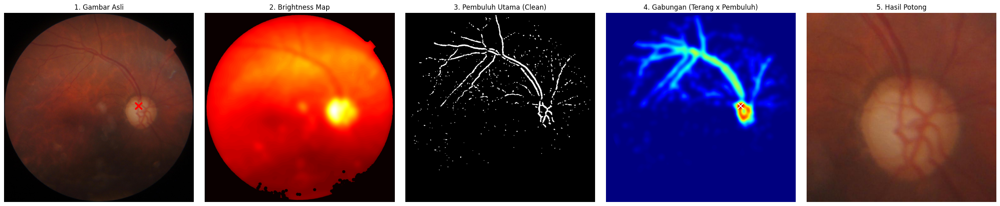

In [50]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def heatmap_optic_disc_crop(img_path, crop_size=600):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    green_channel = img[:, :, 1]

    # ==========================================
    # TAHAP 0: Masker FOV (Membuang Batas Luar)
    # ==========================================
    _, fov_mask = cv2.threshold(green_channel, 15, 255, cv2.THRESH_BINARY)
    kernel_fov = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (31, 31))
    fov_mask = cv2.erode(fov_mask, kernel_fov, iterations=1)

    # ==========================================
    # TAHAP 1: PETA INTENSITAS CAHAYA (BRIGHTNESS)
    # ==========================================
    # Blur ekstrim untuk memetakan area terang secara umum
    bright_blur = cv2.GaussianBlur(green_channel, (151, 151), 0)
    bright_blur = cv2.bitwise_and(bright_blur, bright_blur, mask=fov_mask)

    # Normalisasi ke rentang 0.0 - 1.0 agar bisa dikalikan
    bright_norm = cv2.normalize(bright_blur.astype(np.float32), None, 0, 1, cv2.NORM_MINMAX)

    # ==========================================
    # TAHAP 2: PETA KONVERGENSI PEMBULUH DARAH
    # ==========================================
    # Median blur yang kuat untuk menghapus noise sebelum ekstraksi
    green_clean = cv2.medianBlur(green_channel, 9)

    # Black-Hat untuk mengekstrak garis gelap
    kernel_bh = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (21, 21))
    blackhat = cv2.morphologyEx(green_clean, cv2.MORPH_BLACKHAT, kernel_bh)

    # Filter ketat: Hanya ambil top 8% piksel paling gelap sebagai pembuluh utama
    valid_bh = blackhat[fov_mask > 0]
    thresh_val = np.percentile(valid_bh, 92) if len(valid_bh) > 0 else 50
    _, vessels = cv2.threshold(blackhat, thresh_val, 255, cv2.THRESH_BINARY)
    vessels = cv2.bitwise_and(vessels, vessels, mask=fov_mask)

    # Bersihkan sisa titik-titik noise kecil (Opening)
    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    vessels_clean = cv2.morphologyEx(vessels, cv2.MORPH_OPEN, kernel_open)

    # Blur ekstrim pada mask pembuluh. Area tempat bertemunya
    # banyak garis akan menghasilkan intensitas blur (panas) tertinggi.
    vessel_density = cv2.GaussianBlur(vessels_clean, (151, 151), 0)
    vessel_norm = cv2.normalize(vessel_density.astype(np.float32), None, 0, 1, cv2.NORM_MINMAX)

    # ==========================================
    # TAHAP 3: PENGGABUNGAN (INTERSECTION)
    # ==========================================
    # Saraf optik = Area Terang AND Titik Kumpul Pembuluh
    combined_heatmap = cv2.multiply(bright_norm, vessel_norm)

    # Titik maksimum dari peta gabungan ini adalah pusat saraf optik
    _, _, _, max_loc = cv2.minMaxLoc(combined_heatmap)
    cx, cy = max_loc

    # ==========================================
    # TAHAP 4: PEMOTONGAN
    # ==========================================
    half = crop_size // 2
    h, w = img.shape[:2]

    x1, y1 = max(0, cx - half), max(0, cy - half)
    x2, y2 = min(w, cx + half), min(h, cy + half)

    img_cropped = img[y1:y2, x1:x2]

    # Visualisasi Proses
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))

    axes[0].imshow(img)
    axes[0].set_title("1. Gambar Asli")
    axes[0].scatter([cx], [cy], color='red', s=150, marker='x', linewidths=3)

    axes[1].imshow(bright_norm, cmap='hot')
    axes[1].set_title("2. Brightness Map")

    axes[2].imshow(vessels_clean, cmap='gray')
    axes[2].set_title("3. Pembuluh Utama (Clean)")

    axes[3].imshow(combined_heatmap, cmap='jet')
    axes[3].set_title("4. Gabungan (Terang x Pembuluh)")
    axes[3].scatter([cx], [cy], color='white', s=100, marker='x')

    axes[4].imshow(img_cropped)
    axes[4].set_title("5. Hasil Potong")

    for ax in axes: ax.axis('off')
    plt.tight_layout()
    plt.show()

# Eksekusi dengan gambar bermasalah
sample_img_path = os.path.join(IMAGE_DIR, train_df['Image Name'].iloc[20])
heatmap_optic_disc_crop(sample_img_path)

# Aplikasi Experiment

In [51]:
import cv2
import numpy as np
from PIL import Image

def get_optic_disc_crop(img_path, crop_size=600):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    green_channel = img[:, :, 1]

    # 0. FOV Mask
    _, fov_mask = cv2.threshold(green_channel, 15, 255, cv2.THRESH_BINARY)
    kernel_fov = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (31, 31))
    fov_mask = cv2.erode(fov_mask, kernel_fov, iterations=1)

    # 1. Brightness Map
    bright_blur = cv2.GaussianBlur(green_channel, (151, 151), 0)
    bright_blur = cv2.bitwise_and(bright_blur, bright_blur, mask=fov_mask)
    bright_norm = cv2.normalize(bright_blur.astype(np.float32), None, 0, 1, cv2.NORM_MINMAX)

    # 2. Vessel Convergence Map
    green_clean = cv2.medianBlur(green_channel, 9)
    kernel_bh = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (21, 21))
    blackhat = cv2.morphologyEx(green_clean, cv2.MORPH_BLACKHAT, kernel_bh)

    valid_bh = blackhat[fov_mask > 0]
    thresh_val = np.percentile(valid_bh, 92) if len(valid_bh) > 0 else 50
    _, vessels = cv2.threshold(blackhat, thresh_val, 255, cv2.THRESH_BINARY)
    vessels = cv2.bitwise_and(vessels, vessels, mask=fov_mask)

    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    vessels_clean = cv2.morphologyEx(vessels, cv2.MORPH_OPEN, kernel_open)

    vessel_density = cv2.GaussianBlur(vessels_clean, (151, 151), 0)
    vessel_norm = cv2.normalize(vessel_density.astype(np.float32), None, 0, 1, cv2.NORM_MINMAX)

    # 3. Intersection & Center Point
    combined_heatmap = cv2.multiply(bright_norm, vessel_norm)
    _, _, _, max_loc = cv2.minMaxLoc(combined_heatmap)
    cx, cy = max_loc

    # 4. Cropping
    half = crop_size // 2
    h, w = img.shape[:2]
    x1, y1 = max(0, cx - half), max(0, cy - half)
    x2, y2 = min(w, cx + half), min(h, cy + half)

    img_cropped = img[y1:y2, x1:x2]

    # Kembalikan sebagai objek gambar PIL agar kompatibel dengan PyTorch Transforms
    return Image.fromarray(img_cropped)

In [54]:
import os
from tqdm import tqdm
import shutil

# Tentukan folder sumber dan folder tujuan
SOURCE_DIR = IMAGE_DIR # Path folder gambar asli Anda
TARGET_DIR = 'Cropped_Images'

os.makedirs(TARGET_DIR, exist_ok=True)

def preprocess_and_save_all(dataframe, source_dir, target_dir):
    for idx, row in tqdm(dataframe.iterrows(), total=len(dataframe), desc="Memotong Gambar"):
        img_name = row['Image Name']
        source_path = os.path.join(source_dir, img_name)
        target_path = os.path.join(target_dir, img_name)

        # Lewati jika gambar sudah pernah dipotong (berguna jika proses terhenti di tengah jalan)
        if os.path.exists(target_path):
            continue

        try:
            # Gunakan fungsi get_optic_disc_crop yang sudah dibuat sebelumnya
            img_cropped = get_optic_disc_crop(source_path, crop_size=600)
            img_cropped.save(target_path)
        except Exception as e:
            print(f"Gagal memproses {img_name}, menyalin gambar asli... Error: {e}")
            # Fallback: jika gagal, salin gambar asli agar dataset tetap utuh
            shutil.copy(source_path, target_path)

# Eksekusi untuk semua dataset
print("Memproses Training Set...")
preprocess_and_save_all(train_df, SOURCE_DIR, TARGET_DIR)

print("\nMemproses Validation Set...")
preprocess_and_save_all(val_df, SOURCE_DIR, TARGET_DIR)

print("\nMemproses Test Set...")
preprocess_and_save_all(test_df, SOURCE_DIR, TARGET_DIR)

print("\nSemua gambar berhasil dipotong dan disimpan di folder:", TARGET_DIR)

Memproses Training Set...


Memotong Gambar: 100%|██████████| 537/537 [10:17<00:00,  1.15s/it]



Memproses Validation Set...


Memotong Gambar: 100%|██████████| 106/106 [01:57<00:00,  1.11s/it]



Memproses Test Set...


Memotong Gambar: 100%|██████████| 104/104 [01:55<00:00,  1.11s/it]


Semua gambar berhasil dipotong dan disimpan di folder: Cropped_Images


In [87]:
class FastCroppedDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.image_dir = image_dir # Ini nanti diarahkan ke folder Cropped_Images
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name = self.dataframe.loc[idx, 'Image Name']
        img_path = os.path.join(self.image_dir, img_name)

        # Hanya membaca gambar, tidak ada komputasi berat di sini
        image = Image.open(img_path).convert('RGB')

        label = int(self.dataframe.loc[idx, 'Label'])
        quality = float(self.dataframe.loc[idx, 'Quality Score'])

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.float32), torch.tensor(quality, dtype=torch.float32)

# ==========================================
# INISIALISASI DATALOADER CEPAT
# ==========================================
# Arahkan image_dir ke TARGET_DIR ('Cropped_Images')
train_dataset_fast = FastCroppedDataset(train_df, TARGET_DIR, transform=train_transform)
val_dataset_fast = FastCroppedDataset(val_df, TARGET_DIR, transform=eval_transform)
test_dataset_fast = FastCroppedDataset(test_df, TARGET_DIR, transform=eval_transform)

train_loader_fast = DataLoader(train_dataset_fast, batch_size=32, sampler=imbalance_sampler, num_workers=2, drop_last=True)
val_loader_fast = DataLoader(val_dataset_fast, batch_size=32, shuffle=False, num_workers=2)
test_loader_fast = DataLoader(test_dataset_fast, batch_size=32, shuffle=False, num_workers=2)

In [88]:
# Inisialisasi model baru dari awal agar tidak tercampur bobot lama
model_final = QualityAwareCNN().to(device)
criterion_final = QualityWeightedBCELoss()
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler

# 1. Gunakan AdamW
# Base Learning Rate bisa sedikit lebih besar (1e-4) karena sistem restart akan mengamankannya
LEARNING_RATE = 1e-4
optimizer_fast = optim.AdamW(model_final.parameters(), lr=LEARNING_RATE, weight_decay=1e-3)

# 2. Gunakan Cosine Annealing Warm Restarts
# T_0    : Jumlah epoch untuk siklus pertama (kapan restart pertama terjadi)
# T_mult : Pengali panjang siklus berikutnya (misal T_mult=2, siklus berikutnya 20 epoch, lalu 40 epoch)
# eta_min: Nilai minimum LR di dasar kurva sebelum dilonjakkan kembali
scheduler_fast = lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer_fast,
    T_0=10,
    T_mult=2,
    eta_min=1e-6
)
# Jalankan fungsi training yang sudah kita buat sebelumnya
trained_final_model, final_history = train_quality_aware_model(
    model=model_final,
    train_loader=train_loader_fast,
    val_loader=val_loader_fast,
    criterion=criterion_final,
    optimizer=optimizer_fast,
    scheduler=scheduler_fast,
    num_epochs=30,
    patience=10
)

Epoch 1/30
---------------
Train Loss: 0.4115 | Train Acc: 0.5352
Val Loss: 0.3861 | Val Acc: 0.7170
>> Model terbaik diperbarui

Epoch 2/30
---------------
Train Loss: 0.4098 | Train Acc: 0.5605
Val Loss: 0.3513 | Val Acc: 0.7925
>> Model terbaik diperbarui

Epoch 3/30
---------------
Train Loss: 0.3731 | Train Acc: 0.6250
Val Loss: 0.3208 | Val Acc: 0.8679
>> Model terbaik diperbarui

Epoch 4/30
---------------
Train Loss: 0.3546 | Train Acc: 0.6660
Val Loss: 0.3016 | Val Acc: 0.8302
>> Model terbaik diperbarui

Epoch 5/30
---------------
Train Loss: 0.3352 | Train Acc: 0.7090
Val Loss: 0.3189 | Val Acc: 0.8113

Epoch 6/30
---------------
Train Loss: 0.3260 | Train Acc: 0.7227
Val Loss: 0.2833 | Val Acc: 0.8208
>> Model terbaik diperbarui

Epoch 7/30
---------------
Train Loss: 0.3177 | Train Acc: 0.7480
Val Loss: 0.2540 | Val Acc: 0.8679
>> Model terbaik diperbarui

Epoch 8/30
---------------
Train Loss: 0.3274 | Train Acc: 0.6875
Val Loss: 0.2462 | Val Acc: 0.8774
>> Model terbaik 

In [89]:
# 1. Pastikan menggunakan test_loader_fast
y_true, y_pred_bin, y_pred_prob, q_scores = get_predictions(trained_final_model, test_loader_fast, is_quality_aware=True)

print("HASIL EVALUASI MODEL QUALITY-AWARE PADA TEST SET\n" + "="*50)

# A. Evaluasi Global (Semua Gambar)
cm_global, auc_global = calculate_and_print_metrics(y_true, y_pred_bin, y_pred_prob, "Global (Semua Kualitas)")

# B. Evaluasi Kualitas Rendah (Skor 1-3)
mask_low = (q_scores >= 1) & (q_scores <= 3)
calculate_and_print_metrics(y_true[mask_low], y_pred_bin[mask_low], y_pred_prob[mask_low], "Kualitas Rendah (Skor 1-3)")

# C. Evaluasi Kualitas Menengah (Skor 4-7)
mask_med = (q_scores >= 4) & (q_scores <= 7)
calculate_and_print_metrics(y_true[mask_med], y_pred_bin[mask_med], y_pred_prob[mask_med], "Kualitas Menengah (Skor 4-7)")

# D. Evaluasi Kualitas Tinggi (Skor 8-10)
mask_high = (q_scores >= 8) & (q_scores <= 10)
calculate_and_print_metrics(y_true[mask_high], y_pred_bin[mask_high], y_pred_prob[mask_high], "Kualitas Tinggi (Skor 8-10)")

HASIL EVALUASI MODEL QUALITY-AWARE PADA TEST SET
--- Metrik Global (Semua Kualitas) ---
Jumlah Sampel : 104
F1-Score      : 0.9268
Sensitivitas  : 0.9620
Spesifisitas  : 0.6400
ROC-AUC       : 0.9276
Confusion Mat : TP=76, FP=9, TN=16, FN=3
------------------------------

--- Metrik Kualitas Rendah (Skor 1-3) ---
Tidak ada sampel pada rentang kualitas ini.

--- Metrik Kualitas Menengah (Skor 4-7) ---
Jumlah Sampel : 91
F1-Score      : 0.9220
Sensitivitas  : 0.9559
Spesifisitas  : 0.6522
ROC-AUC       : 0.9265
Confusion Mat : TP=65, FP=8, TN=15, FN=3
------------------------------

--- Metrik Kualitas Tinggi (Skor 8-10) ---
Tidak ada sampel pada rentang kualitas ini.



Total False Negatives (Prediksi Normal, Asli Glaukoma): 3
Total False Positives (Prediksi Glaukoma, Asli Normal): 9

--- VISUALISASI FALSE NEGATIVES ---


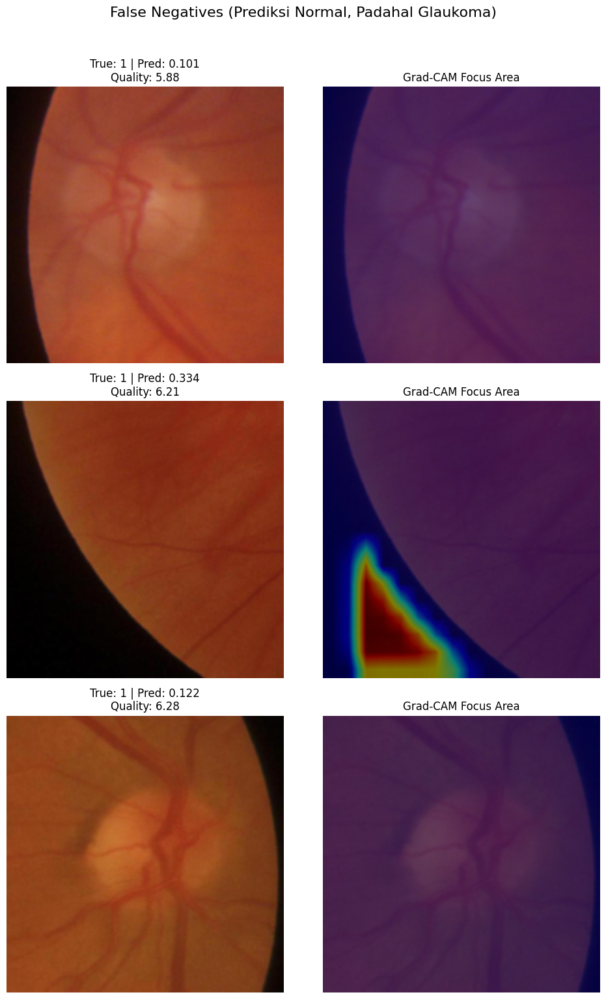

--- VISUALISASI FALSE POSITIVES ---


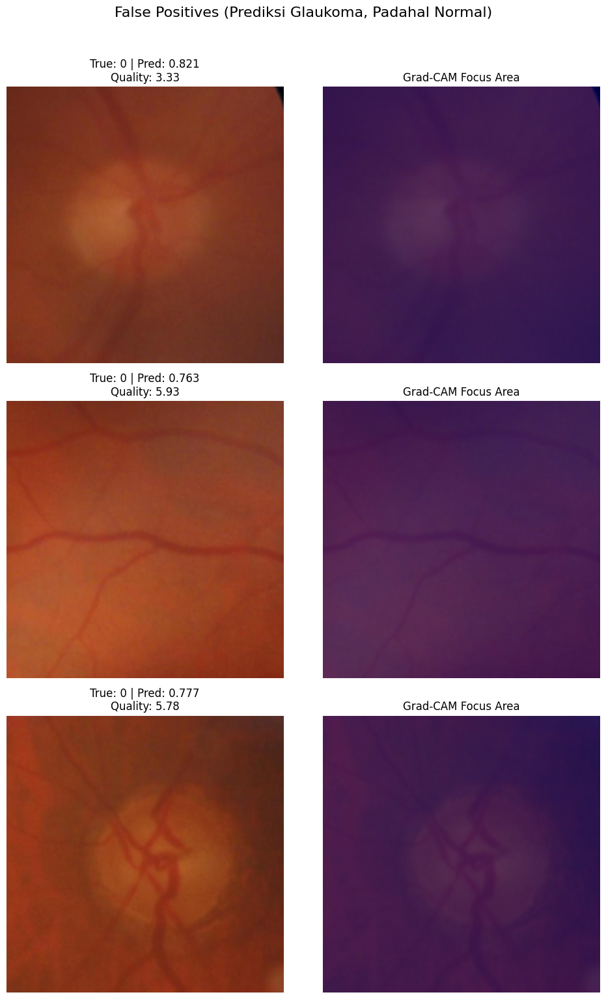

In [90]:
analyze_errors(
    dataset=test_dataset_fast,
    y_true=y_true,
    y_pred_bin=y_pred_bin,
    y_pred_prob=y_pred_prob,
    q_scores=q_scores,
    model=trained_final_model,
    num_samples=3
)


 VISUALISASI KEBERHASILAN PADA MODEL FINAL 
Total True Positives (Asli Glaukoma, Ditebak Glaukoma): 76
Total True Negatives (Asli Normal, Ditebak Normal): 16

--- VISUALISASI TRUE POSITIVES ---


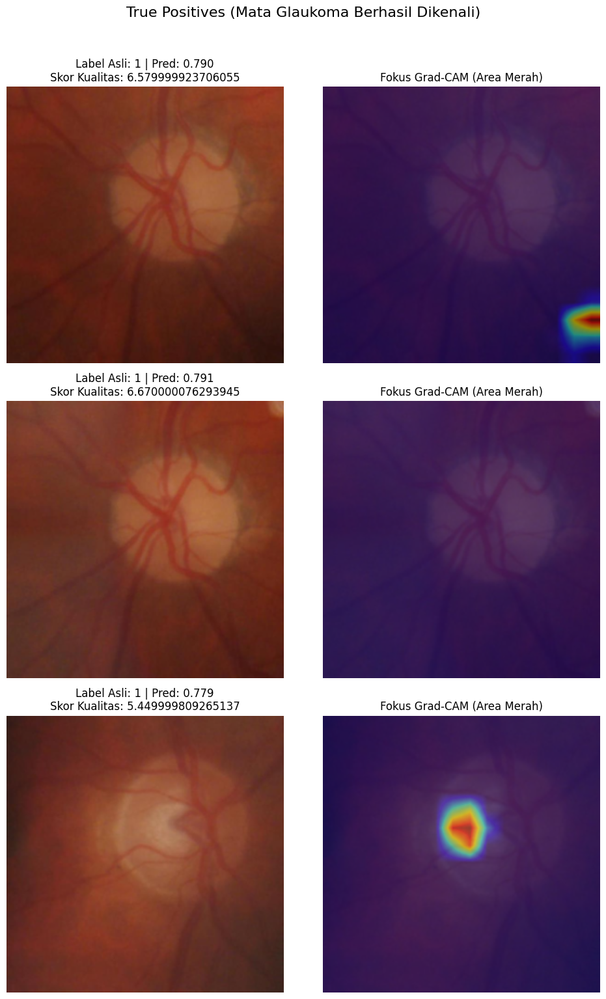

--- VISUALISASI TRUE NEGATIVES ---


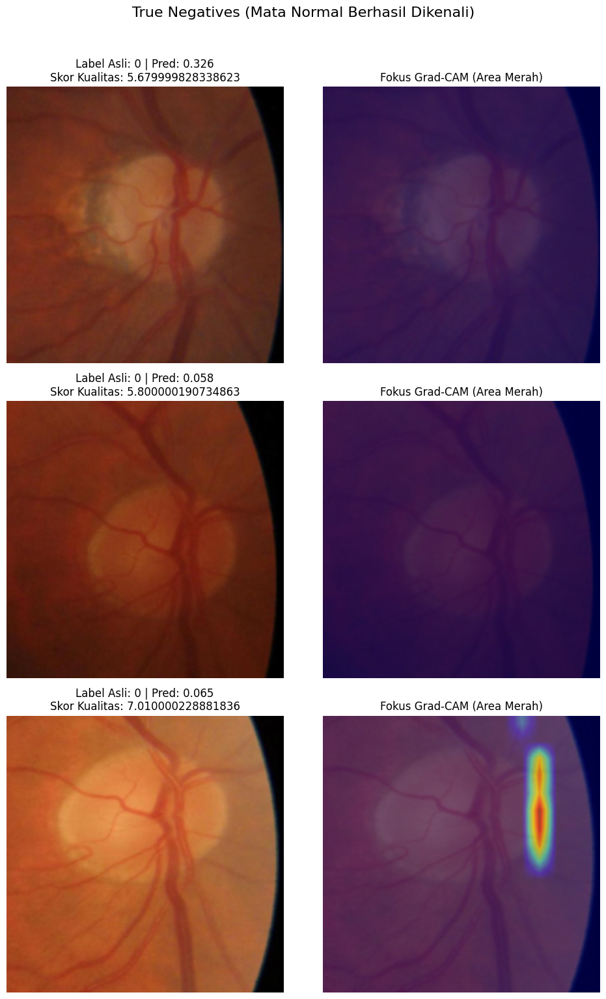

In [91]:
print("\n VISUALISASI KEBERHASILAN PADA MODEL FINAL ")
visualize_gradcam_successes(
    dataset=test_dataset_fast,
    y_true=y_true,
    y_pred_bin=y_pred_bin,
    y_pred_prob=y_pred_prob,
    q_scores=q_scores,
    model=trained_final_model,
    target_layer=trained_final_model.conv5,
    is_quality_aware=True,
    num_samples=3
)

# Model Pretrained

In [93]:
from torchvision import models
from torchvision.models import ResNet18_Weights
import torch.nn as nn
import torch

# Muat arsitektur ResNet-18 dengan bobot standar
model_pretrained = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)

# Ubah lapisan klasifikasi terakhir (fc) untuk menghasilkan 1 output probabilitas
num_ftrs = model_pretrained.fc.in_features
model_pretrained.fc = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_ftrs, 1)
)

model_pretrained = model_pretrained.to(device)

# Loss standar tanpa pembobotan kualitas
# Menggunakan BCEWithLogitsLoss agar lebih stabil secara numerik
criterion_standard = nn.BCEWithLogitsLoss()

optimizer_pretrained = torch.optim.AdamW(model_pretrained.parameters(), lr=1e-4, weight_decay=1e-3)
scheduler_pretrained = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer_pretrained, T_0=10, T_mult=2, eta_min=1e-6
)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 73.3MB/s]


In [95]:
def train_standard_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=30, patience=5):
    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_loss = float('inf')
    epochs_no_improve = 0
    history = {'train_loss': [], 'val_loss': []}

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        # Perbaikan: Unpack 3 nilai (images, labels, qualities)
        for images, labels, _ in train_loader:
            images = images.to(device)
            labels = labels.unsqueeze(1).to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()
            running_loss += loss.item() * images.size(0)

        epoch_train_loss = running_loss / len(train_loader.dataset)

        # Validation Phase
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, labels, _ in val_loader:
                images = images.to(device)
                labels = labels.unsqueeze(1).to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

        epoch_val_loss = val_loss / len(val_loader.dataset)
        scheduler.step() # Update learning rate

        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {epoch_train_loss:.4f} | Val Loss: {epoch_val_loss:.4f}")

        # Early Stopping
        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f"Early stopping dijalankan pada epoch {epoch+1}.")
                break

    model.load_state_dict(best_model_wts)
    return model, history

# Eksekusi Training
print("Memulai proses training model Pretrained...")
trained_pretrained_model, pretrained_history = train_standard_model(
    model_pretrained, train_loader, val_loader,
    criterion_standard, optimizer_pretrained, scheduler_pretrained,
    num_epochs=30, patience=6
)

Memulai proses training model Pretrained...
Epoch 1/30 | Train Loss: 0.4097 | Val Loss: 0.1875
Epoch 2/30 | Train Loss: 0.1591 | Val Loss: 0.1332
Epoch 3/30 | Train Loss: 0.1049 | Val Loss: 0.1239
Epoch 4/30 | Train Loss: 0.0679 | Val Loss: 0.1357
Epoch 5/30 | Train Loss: 0.0468 | Val Loss: 0.1413
Epoch 6/30 | Train Loss: 0.0453 | Val Loss: 0.1425
Epoch 7/30 | Train Loss: 0.0445 | Val Loss: 0.1646
Epoch 8/30 | Train Loss: 0.0287 | Val Loss: 0.1561
Epoch 9/30 | Train Loss: 0.0358 | Val Loss: 0.1534
Early stopping dijalankan pada epoch 9.


In [98]:
def evaluate_standard_model(model, dataloader, model_name):
    model.eval()
    all_preds_prob = []
    all_labels = []

    with torch.no_grad():
        # Perbaikan: Unpack 3 nilai dari dataloader (images, labels, _)
        for images, labels, _ in dataloader:
            images = images.to(device)
            # Karena menggunakan BCEWithLogitsLoss saat training, output model adalah nilai logit
            # Harus dilewatkan ke Sigmoid untuk mendapatkan probabilitas [0, 1]
            outputs = model(images)
            probs = torch.sigmoid(outputs).squeeze().cpu().numpy()

            all_preds_prob.extend(probs if probs.ndim > 0 else [probs])
            all_labels.extend(labels.numpy())

    y_true = np.array(all_labels)
    y_pred_prob = np.array(all_preds_prob)
    y_pred_bin = (y_pred_prob >= 0.5).astype(float)

    cm = confusion_matrix(y_true, y_pred_bin, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
    f1 = f1_score(y_true, y_pred_bin, zero_division=0)
    auc = roc_auc_score(y_true, y_pred_prob)

    return {
        'Model': model_name,
        'N': len(y_true),
        'F1-Score': round(f1, 4),
        'Sensitivitas': round(sensitivity, 4),
        'Spesifisitas': round(specificity, 4),
        'ROC-AUC': round(auc, 4)
    }

# Ambil metrik dan tampilkan
result_pretrained = evaluate_standard_model(trained_pretrained_model, test_loader, 'ResNet-18')
df_pretrained = pd.DataFrame([result_pretrained])
display(df_pretrained)

,Model,N,F1-Score,Sensitivitas,Spesifisitas,ROC-AUC
0,ResNet-18,104,0.9359,0.9241,0.84,0.9772


--- VISUALISASI KEBERHASILAN (TP & TN) PADA RESNET-18 ---
Total True Positives (Asli Glaukoma, Ditebak Glaukoma): 73
Total True Negatives (Asli Normal, Ditebak Normal): 21

--- VISUALISASI TRUE POSITIVES ---


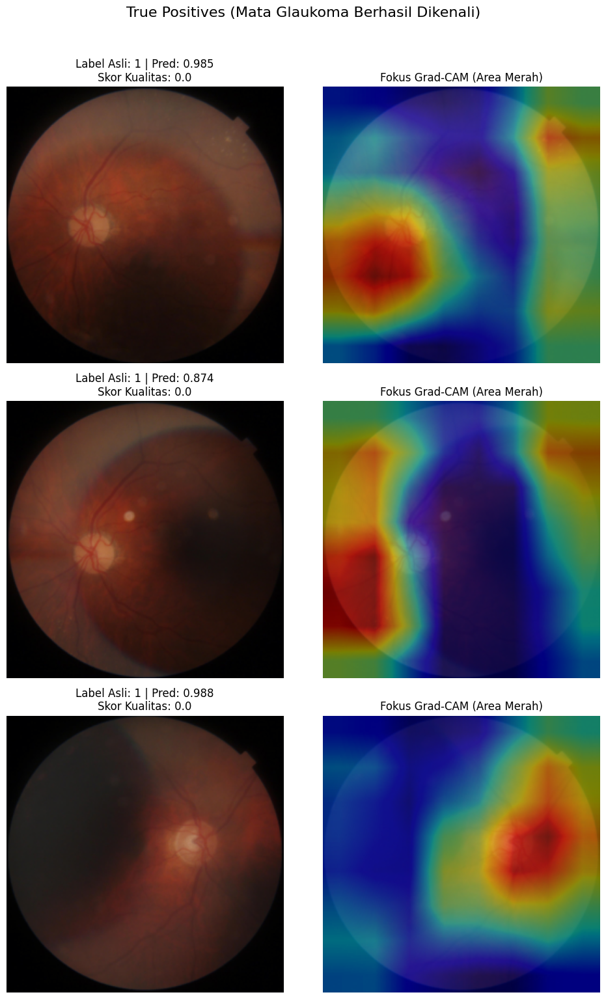

--- VISUALISASI TRUE NEGATIVES ---


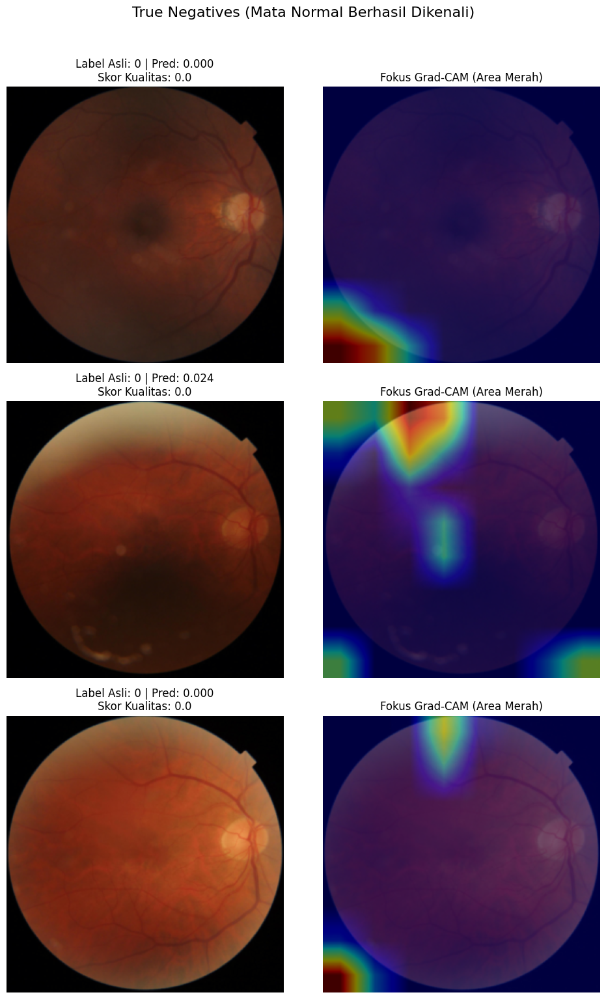

In [102]:
import numpy as np
import torch

# 1. AMBIL PREDIKSI DARI MODEL RESNET-18
trained_pretrained_model.eval()
all_preds_prob = []
all_labels = []

with torch.no_grad():
    # Perbaikan: Unpack 3 nilai (images, labels, quality_scores)
    for images, labels, _ in test_loader:
        images = images.to(device)
        # Gunakan Sigmoid karena model ResNet mengeluarkan logit mentah
        outputs = trained_pretrained_model(images)
        probs = torch.sigmoid(outputs).squeeze().cpu().numpy()

        all_preds_prob.extend(probs if probs.ndim > 0 else [probs])
        all_labels.extend(labels.numpy())

y_true_res = np.array(all_labels)
y_pred_prob_res = np.array(all_preds_prob)
y_pred_bin_res = (y_pred_prob_res >= 0.5).astype(float)

# Buat array dummy untuk q_scores agar tidak error pada indexing fungsi Grad-CAM
dummy_q_scores = np.zeros(len(y_true_res))

# 2. EKSEKUSI GRAD-CAM (SUCCESSES)
print("--- VISUALISASI KEBERHASILAN (TP & TN) PADA RESNET-18 ---")
visualize_gradcam_successes(
    dataset=test_dataset,                            # Gunakan dataset asli (Raw)
    y_true=y_true_res,
    y_pred_bin=y_pred_bin_res,
    y_pred_prob=y_pred_prob_res,
    q_scores=dummy_q_scores,
    model=trained_pretrained_model,                      # Gunakan model ResNet
    target_layer=trained_pretrained_model.layer4[-1],    # Layer terakhir ResNet18
    is_quality_aware=False,                              # Matikan input kualitas
    num_samples=3
)



# Evaluasi Semua Model

In [109]:
# ==========================================
# 3. EKSEKUSI PENGUMPULAN DATA & RENDER TABEL
# ==========================================
y_true_b, y_pred_bin_b, y_pred_prob_b, q_scores_b = get_predictions(trained_model, test_loader, is_quality_aware=False)
y_true_q, y_pred_bin_q, y_pred_prob_q, q_scores_q = get_predictions(trained_qa_model, test_loader, is_quality_aware=True)
y_true, y_pred_bin, y_pred_prob, q_scores = get_predictions(trained_final_model, test_loader_fast, is_quality_aware=True)
y_true_res, y_pred_bin_res, y_pred_prob_res, q_scores_res = get_predictions(trained_pretrained_model, test_loader, is_quality_aware=False)

results = []

def evaluate_and_append(y_t, y_p_b, y_p_p, q_s, model_name):
    # Global
    results.append(calculate_metrics_dict(y_t, y_p_b, y_p_p, model_name, 'Global (Semua)'))

    # Rendah
    mask = (q_s >= 1) & (q_s <= 4)
    results.append(calculate_metrics_dict(y_t[mask], y_p_b[mask], y_p_p[mask], model_name, 'Rendah (1-3)'))

    # Menengah
    mask = (q_s > 4) & (q_s <= 6)
    results.append(calculate_metrics_dict(y_t[mask], y_p_b[mask], y_p_p[mask], model_name, 'Menengah (3-6)'))

    # Tinggi
    mask = (q_s > 6) & (q_s <= 10)
    results.append(calculate_metrics_dict(y_t[mask], y_p_b[mask], y_p_p[mask], model_name, 'Tinggi (6-10)'))

evaluate_and_append(y_true_b, y_pred_bin_b, y_pred_prob_b, q_scores_b, 'Baseline CNN')
evaluate_and_append(y_true_q, y_pred_bin_q, y_pred_prob_q, q_scores_q, 'Quality-Aware CNN')
evaluate_and_append(y_true, y_pred_bin, y_pred_prob, q_scores, 'Cropped Image CNN')
evaluate_and_append(y_true_res, y_pred_bin_res, y_pred_prob_res, q_scores_res, 'ResNet-18')

# Render hasil dalam bentuk DataFrame agar formatnya rapi di notebook
df_results = pd.DataFrame(results)
display(df_results)

,Model,Kualitas,N,TP,FP,TN,FN,F1-Score,Sensitivitas,Spesifisitas,ROC-AUC
0,Baseline CNN,Global (Semua),104,76,3,22,3,0.9620,0.9620,0.8800,0.9772
1,Baseline CNN,Rendah (1-3),5,3,0,1,1,0.8571,0.7500,1.0000,1.0000
2,Baseline CNN,Menengah (3-6),36,25,3,6,2,0.9091,0.9259,0.6667,0.9218
3,Baseline CNN,Tinggi (6-10),63,48,0,15,0,1.0000,1.0000,1.0000,1.0000
4,Quality-Aware CNN,Global (Semua),104,77,4,21,2,0.9625,0.9747,0.8400,0.9570
5,Quality-Aware CNN,Rendah (1-3),5,3,0,1,1,0.8571,0.7500,1.0000,1.0000
6,Quality-Aware CNN,Menengah (3-6),36,26,3,6,1,0.9286,0.9630,0.6667,0.8683
7,Quality-Aware CNN,Tinggi (6-10),63,48,1,14,0,0.9897,1.0000,0.9333,1.0000
8,Cropped Image CNN,Global (Semua),104,76,9,16,3,0.9268,0.9620,0.6400,0.9276
9,Cropped Image CNN,Rendah (1-3),5,4,1,0,0,0.8889,1.0000,0.0000,0.7500
